In [ ]:
# pip install skforecast

In [ ]:
# pip install lightgbm

In [1]:
import pandas as pd
import numpy as np
from pyspark.sql import SparkSession

import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

In [ ]:
# Crear una sesión de Spark
spark = SparkSession.builder.appName("CargarDatosLimpios").getOrCreate()

# Ruta donde se guardó el DataFrame
ruta_guardado = "/home/jovyan/work/data/processed/Marbella/df_marbella_hourly_cleaned.csv"

# Leer el archivo CSV guardado
df = spark.read.csv(ruta_guardado, header=True, inferSchema=True)

In [3]:
# Mostrar el esquema y algunas filas para verificar
df.printSchema()
df.show(5)

root
 |-- Fecha: timestamp (nullable = true)
 |-- Temperatura_C: double (nullable = true)
 |-- Sensacion_termica_C: double (nullable = true)
 |-- Humedad: integer (nullable = true)
 |-- Presion_mb: double (nullable = true)
 |-- is_day: integer (nullable = true)

+-------------------+-------------+-------------------+-------+----------+------+
|              Fecha|Temperatura_C|Sensacion_termica_C|Humedad|Presion_mb|is_day|
+-------------------+-------------+-------------------+-------+----------+------+
|2024-02-18 00:00:00|         13.4|               12.4|     84|    1033.0|     0|
|2024-02-18 01:00:00|         13.1|               12.2|     84|    1033.0|     0|
|2024-02-18 02:00:00|         12.8|               12.0|     85|    1033.0|     0|
|2024-02-18 03:00:00|         12.5|               11.6|     85|    1033.0|     0|
|2024-02-18 04:00:00|         12.3|               11.5|     84|    1032.0|     0|
+-------------------+-------------+-------------------+-------+----------+------+

In [4]:
df = df.toPandas()
df_pandas = df.copy()

In [5]:
df_pandas.isna().sum()

Fecha                  0
Temperatura_C          0
Sensacion_termica_C    0
Humedad                0
Presion_mb             0
is_day                 0
dtype: int64

In [6]:
df_pandas.describe()

,Fecha,Temperatura_C,Sensacion_termica_C,Humedad,Presion_mb,is_day
count,8952,8952.000000,8952.000000,8952.000000,8952.000000,8952.000000
mean,2024-08-22 11:30:00,18.489946,18.580440,64.287757,1017.532395,0.504915
min,2024-02-18 00:00:00,5.700000,2.400000,21.000000,998.000000,0.000000
25%,2024-05-21 05:45:00,14.300000,13.900000,54.000000,1013.000000,0.000000
50%,2024-08-22 11:30:00,18.000000,18.000000,65.000000,1017.000000,1.000000
75%,2024-11-23 17:15:00,22.600000,24.600000,75.000000,1022.000000,1.000000
max,2025-02-24 23:00:00,35.500000,36.500000,98.000000,1037.000000,1.000000
std,NaN,5.419805,6.171377,13.981293,5.948130,0.500004


In [7]:
df_pandas.head(5)

,Fecha,Temperatura_C,Sensacion_termica_C,Humedad,Presion_mb,is_day
0,2024-02-18 00:00:00,13.4,12.4,84,1033.0,0
1,2024-02-18 01:00:00,13.1,12.2,84,1033.0,0
2,2024-02-18 02:00:00,12.8,12.0,85,1033.0,0
3,2024-02-18 03:00:00,12.5,11.6,85,1033.0,0
4,2024-02-18 04:00:00,12.3,11.5,84,1032.0,0


##### Analisis de la serie temporal

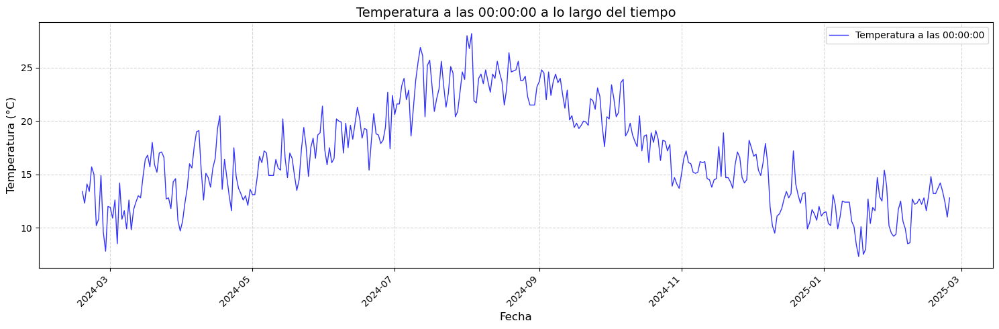

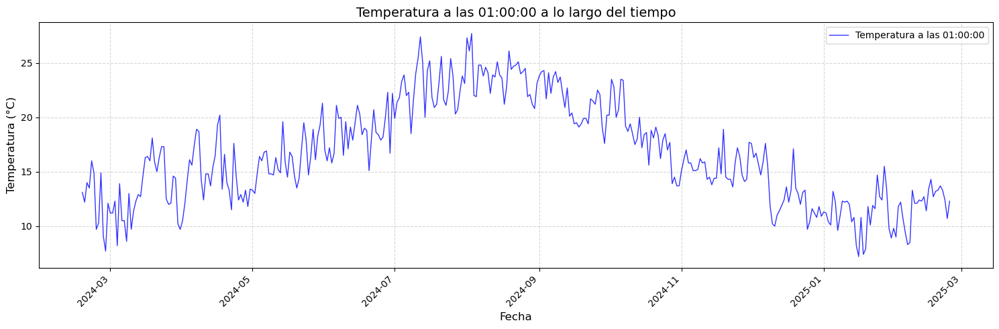

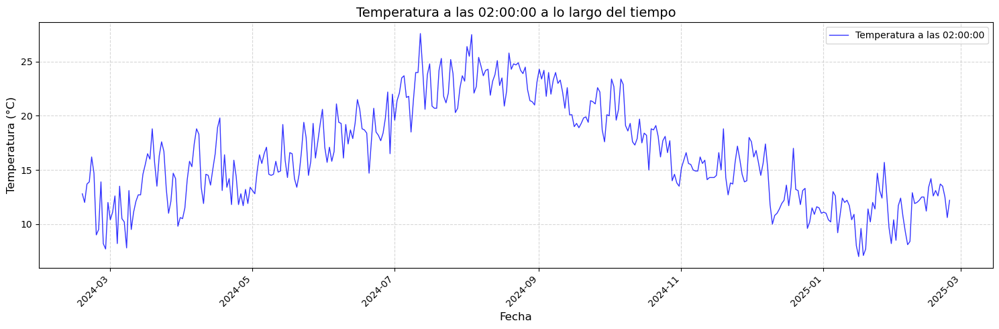

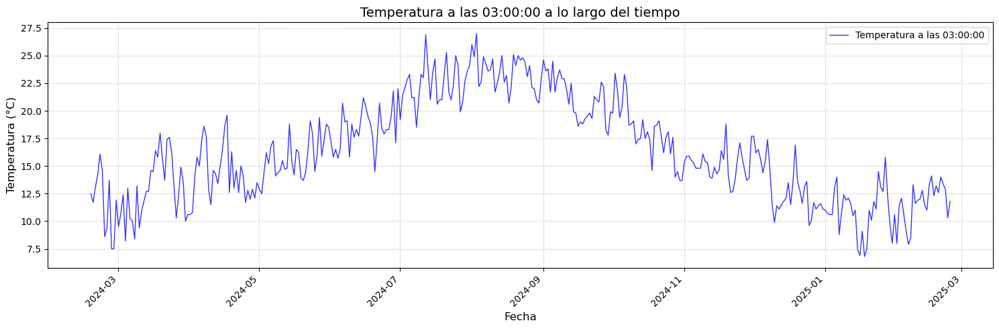

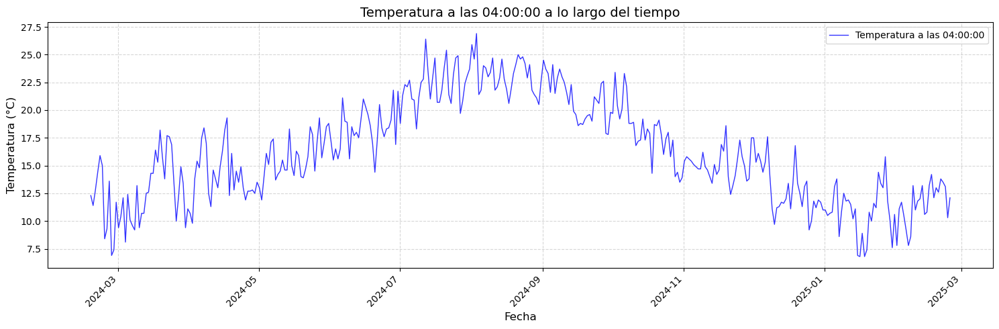

...

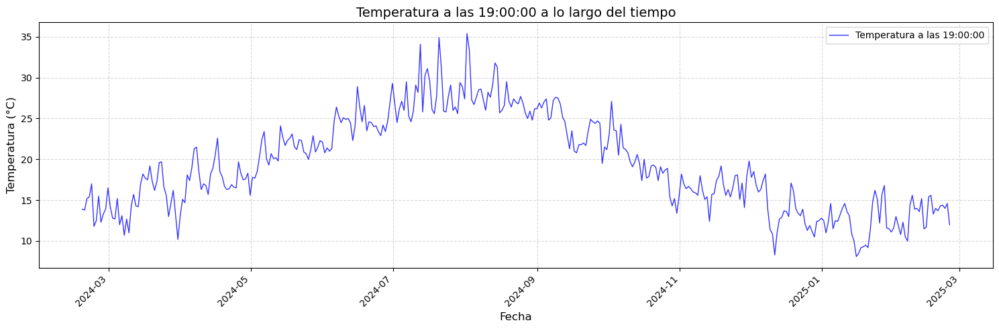

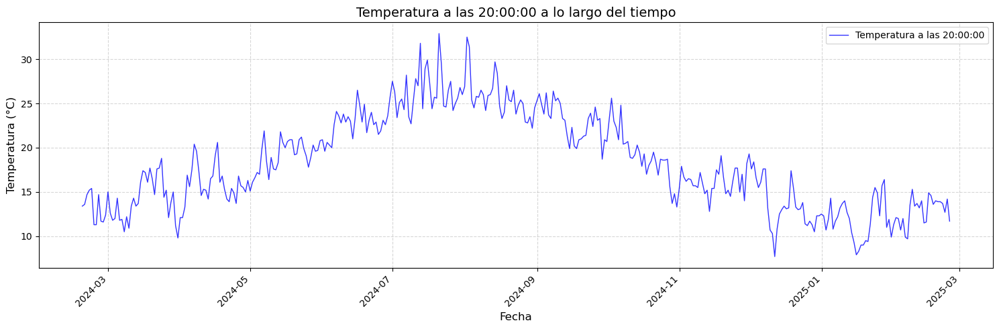

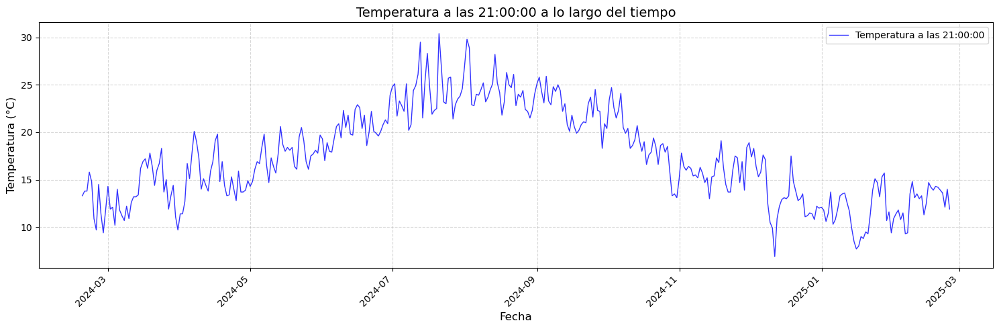

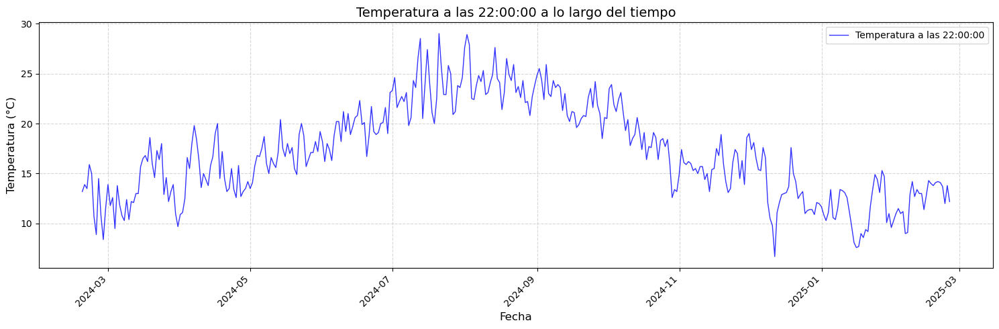

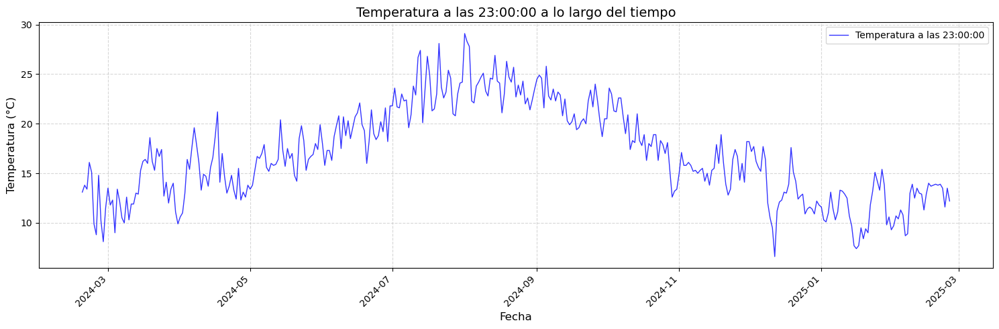

In [8]:
# Convertir la columna 'Fecha' a tipo datetime si no lo está
df_pandas['Fecha'] = pd.to_datetime(df_pandas['Fecha'])

# Ordenar el DataFrame por fecha
df_pandas = df_pandas.sort_values(by='Fecha')

# Extraer la hora de la columna 'Fecha'
df_pandas['Hora'] = df_pandas['Fecha'].dt.hour

# Generar un gráfico para cada hora del día (desde 00:00:00 hasta 23:00:00)
for hora in range(24):  # Las horas van de 0 a 23
    # Filtrar los datos para la hora específica
    df_hora = df_pandas[df_pandas['Hora'] == hora]
    
    plt.figure(figsize=(15, 5))
    
    # Graficar la temperatura para la hora específica
    plt.plot(df_hora['Fecha'], df_hora['Temperatura_C'], linestyle='-', color='b', linewidth=1, alpha=0.8, label=f'Temperatura a las {hora:02d}:00:00')
    
    # Etiquetas y título
    plt.xlabel('Fecha', fontsize=12)
    plt.ylabel('Temperatura (°C)', fontsize=12)
    plt.title(f'Temperatura a las {hora:02d}:00:00 a lo largo del tiempo', fontsize=14)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(rotation=45, ha='right')

    # Mostrar el gráfico
    plt.tight_layout()  # Ajustar el layout para que no se solapen las etiquetas
    plt.show()

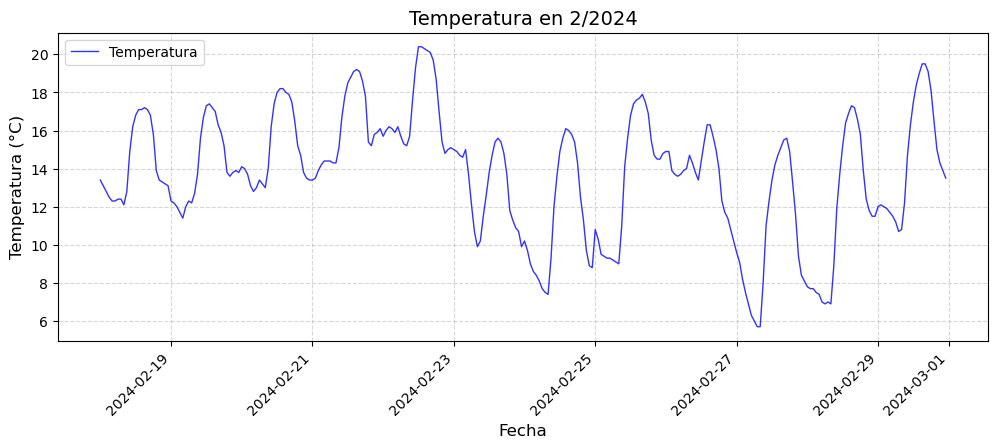

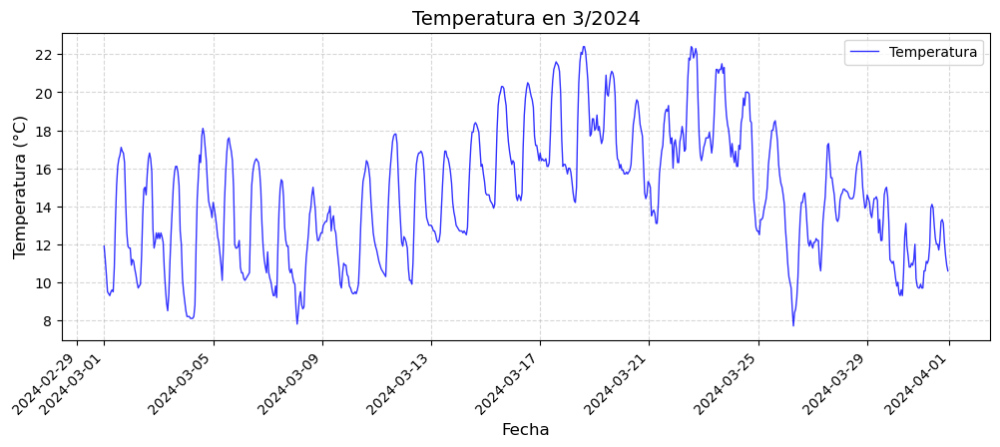

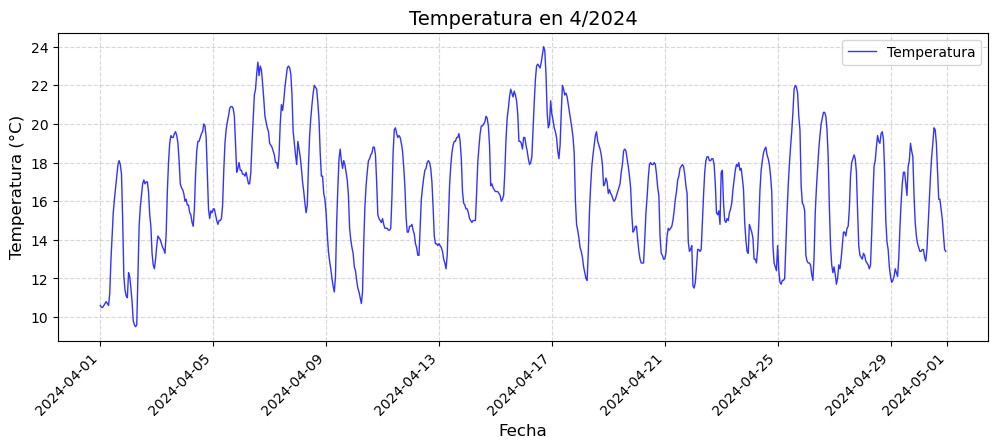

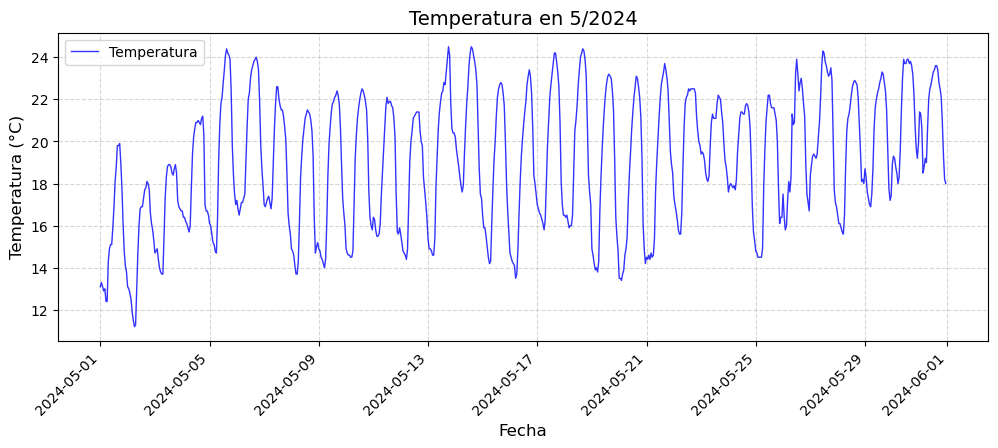

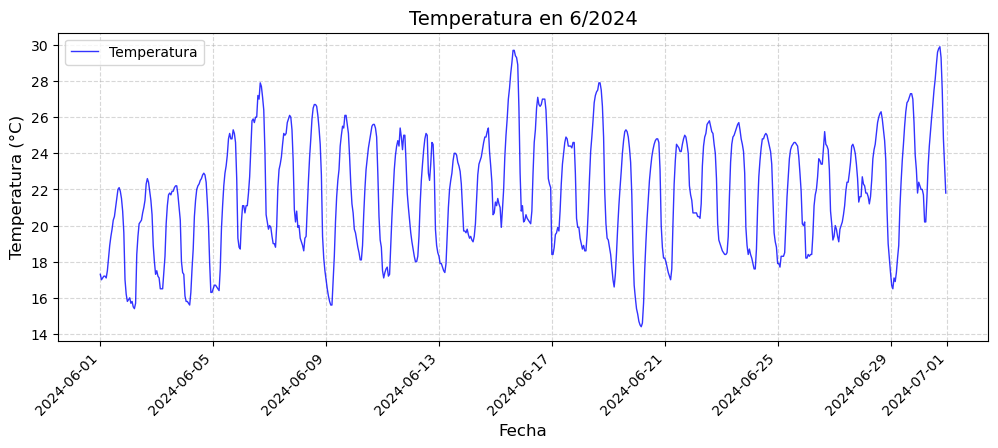

...

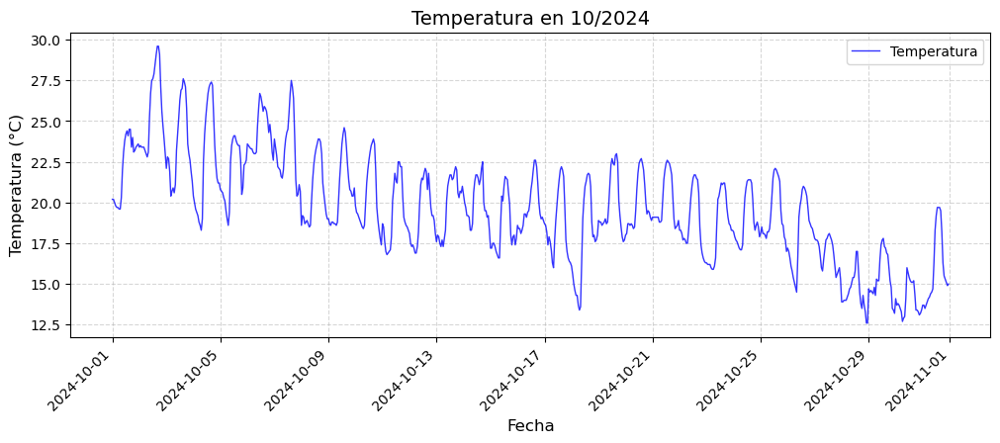

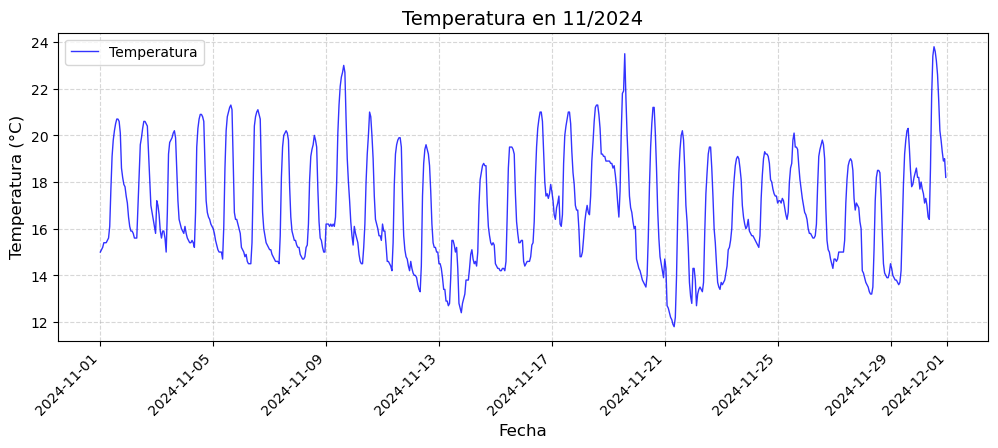

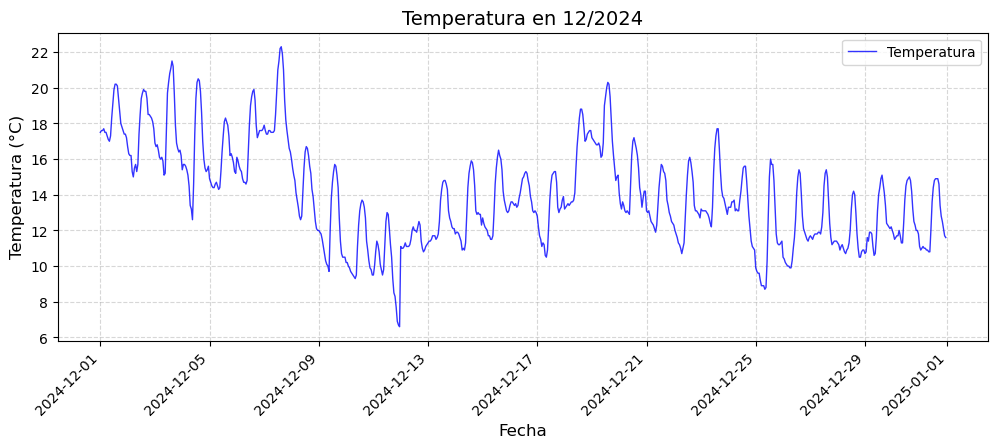

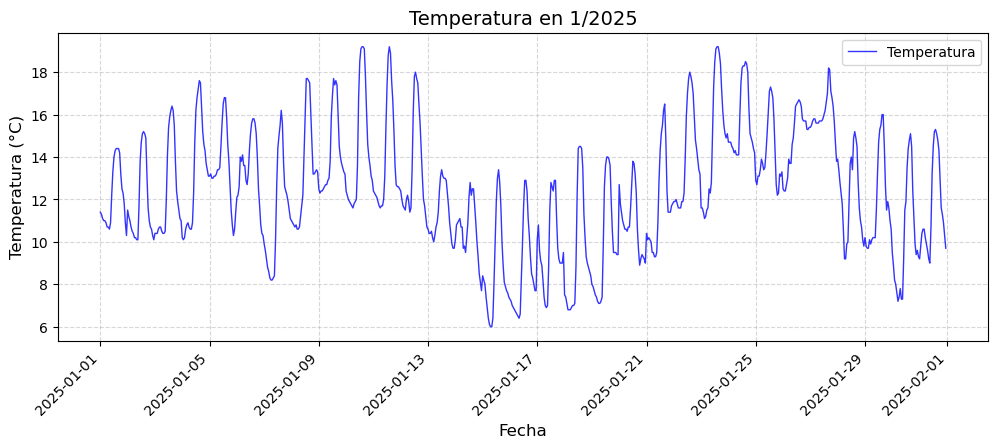

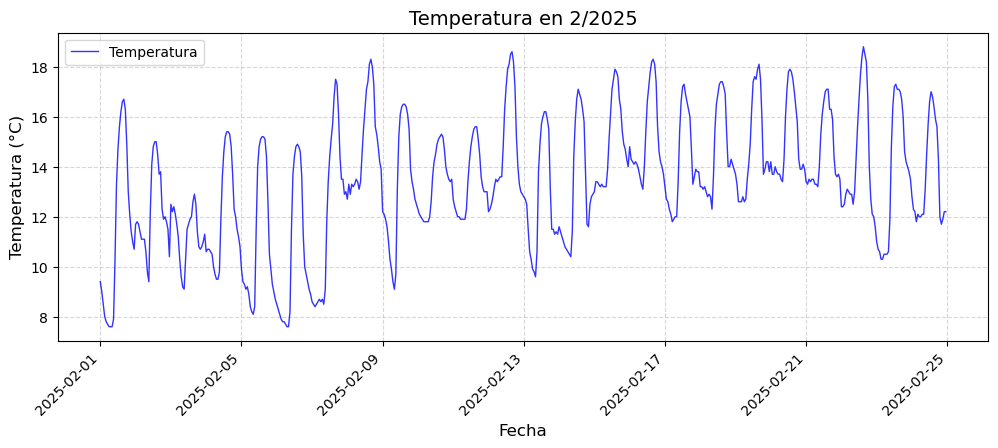

In [9]:
# Convertir la columna 'Fecha' a tipo datetime si no lo está
df_pandas['Fecha'] = pd.to_datetime(df_pandas['Fecha'])

# Ordenar el DataFrame por fecha
df_pandas = df_pandas.sort_values(by='Fecha')

# Obtener combinaciones únicas de año y mes
años_meses_unicos = df_pandas[['Fecha']].copy()
años_meses_unicos['Año'] = df_pandas['Fecha'].dt.year
años_meses_unicos['Mes'] = df_pandas['Fecha'].dt.month
años_meses_unicos = años_meses_unicos.drop_duplicates(subset=['Año', 'Mes'])

# Generar un gráfico por cada mes y año
for _, row in años_meses_unicos.iterrows():
    año, mes = row['Año'], row['Mes']
    df_mensual = df_pandas[(df_pandas['Fecha'].dt.year == año) & (df_pandas['Fecha'].dt.month == mes)]
    
    plt.figure(figsize=(12, 4))
    plt.plot(df_mensual['Fecha'], df_mensual['Temperatura_C'], linestyle='-', color='b', linewidth=1, alpha=0.8, label='Temperatura')

    # Etiquetas y título
    plt.xlabel('Fecha', fontsize=12)
    plt.ylabel('Temperatura (°C)', fontsize=12)
    plt.title(f'Temperatura en {mes}/{año}', fontsize=14)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(rotation=45, ha='right')

    # Mostrar el gráfico
    plt.show()


Descomposicion de la serie temporal por sus componentes

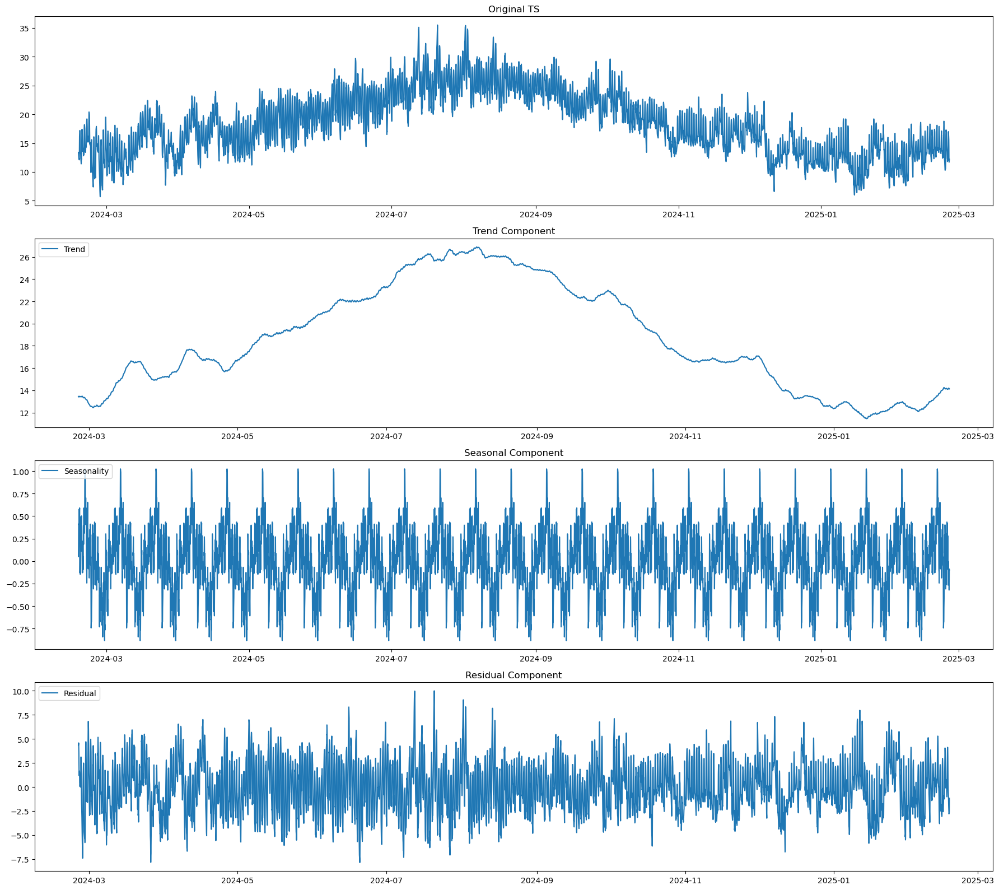

In [10]:
# Decompose the Air Passengers dataset to show trend, seasonality, and residuals
decomposition_air = seasonal_decompose(df_pandas['Temperatura_C'], model='additive', period=365)

# Plot the decomposed components for Air Passengers
plt.figure(figsize=(18, 16))

plt.subplot(4, 1, 1)
plt.plot(df_pandas["Fecha"], df_pandas["Temperatura_C"])
plt.title('Original TS')

plt.subplot(4, 1, 2)
plt.plot(df_pandas["Fecha"], decomposition_air.trend, label='Trend')
plt.legend(loc='upper left')
plt.title('Trend Component')

plt.subplot(4, 1, 3)
plt.plot(df_pandas["Fecha"], decomposition_air.seasonal, label='Seasonality')
plt.legend(loc='upper left')
plt.title('Seasonal Component')

plt.subplot(4, 1, 4)
plt.plot(df_pandas["Fecha"], decomposition_air.resid, label='Residual')
plt.legend(loc='upper left')
plt.title('Residual Component')

plt.tight_layout()
plt.show()

Comprobamos si la serie es estacionaria

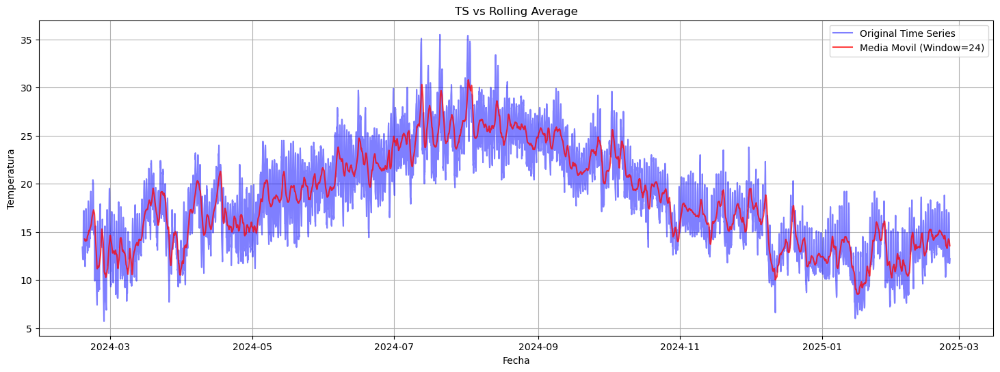

In [11]:
window_size = 24

df_pandas['MA'] = df_pandas["Temperatura_C"].rolling(window=window_size).mean()

plt.figure(figsize=(18, 6))

plt.plot(df_pandas["Fecha"], df_pandas['Temperatura_C'], label='Original Time Series', color='blue', alpha=0.5)
plt.plot(df_pandas["Fecha"], df_pandas['MA'], label=f'Media Movil (Window={window_size})', color='red', alpha=0.75)

plt.title('TS vs Rolling Average')
plt.xlabel('Fecha')
plt.ylabel('Temperatura')
plt.legend()
plt.grid(True)
plt.show()

Realizamos el test ADF (Augmented Dickey-Fuller) para comprobar si la serie es estacionaria

In [12]:
def check_stationarity(series, name):
    result = adfuller(series)
    print(f'ADF Statistic for {name}:', result[0])
    print('p-value:', result[1])
    if result[1] <= 0.05:
        print("The series is likely stationary.")
    else:
        print("The series is likely non-stationary.")

In [13]:
check_stationarity(df['Temperatura_C'], 'Temperatura')

ADF Statistic for Temperatura: -3.484236607331366
p-value: 0.008401281377047182
The series is likely stationary.


Como resultado del test de Dickey-Fuller, observamos que la serie temporal es estacionaria

##### Deteccion de outliers

In [14]:
from scipy.stats import median_abs_deviation

##### Filtro Hampel (with centered window)

El filtro Hampel es un método utilizado para detectar y eliminar valores atípicos en series temporales. Este filtro es una variación de la regla de tres sigmas en estadística que es robusta frente a valores atípicos.
Funciona calculando la mediana de una ventana que incluye la muestra actual y sus vecinos, generalmente tres muestras por lado.

In [15]:
window_size=48
n_sigma=3

#Calculate the median in a rolling centered window
rolling_median = df_pandas["Temperatura_C"].rolling(window_size, center=True).median()

#Calculate the median of the absolute deviations from the data’s median in a rolling centered window
mad = df_pandas["Temperatura_C"].rolling(window_size, center=True).apply(median_abs_deviation)

#Treshold 
threshold_min = rolling_median - n_sigma*mad
threshold_max = rolling_median + n_sigma*mad

df_pandas["outlier_hm"] = (np.abs(df_pandas["Temperatura_C"] - rolling_median) > n_sigma*mad)

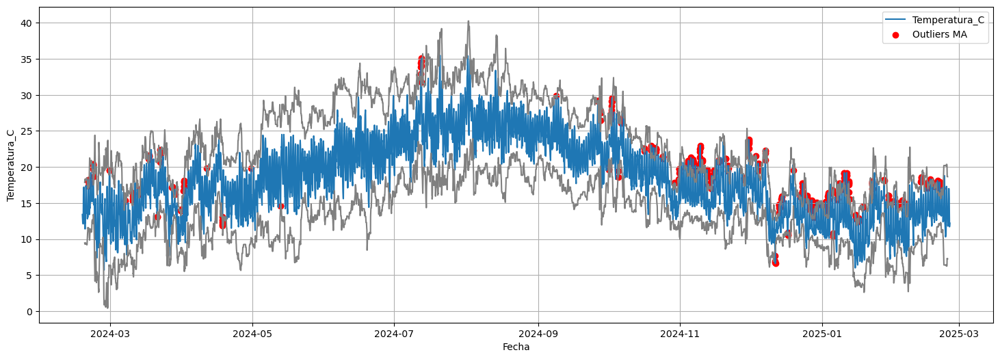

In [16]:
plt.figure(figsize=(18, 6))

plt.plot(df_pandas['Fecha'], df_pandas['Temperatura_C'], label='Temperatura_C')
plt.plot(df_pandas['Fecha'], threshold_min, color='gray')
plt.plot(df_pandas['Fecha'], threshold_max, color='gray')
plt.scatter(df_pandas["Fecha"][df_pandas["outlier_hm"]], df_pandas["Temperatura_C"][df_pandas["outlier_hm"]], color='red', label="Outliers MA")
plt.xlabel('Fecha')
plt.ylabel('Temperatura_C')
plt.legend()
plt.grid(True)
plt.show()

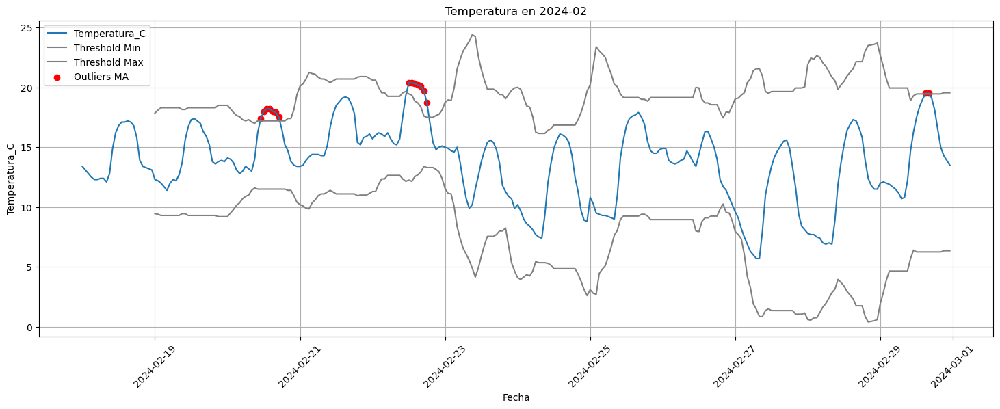

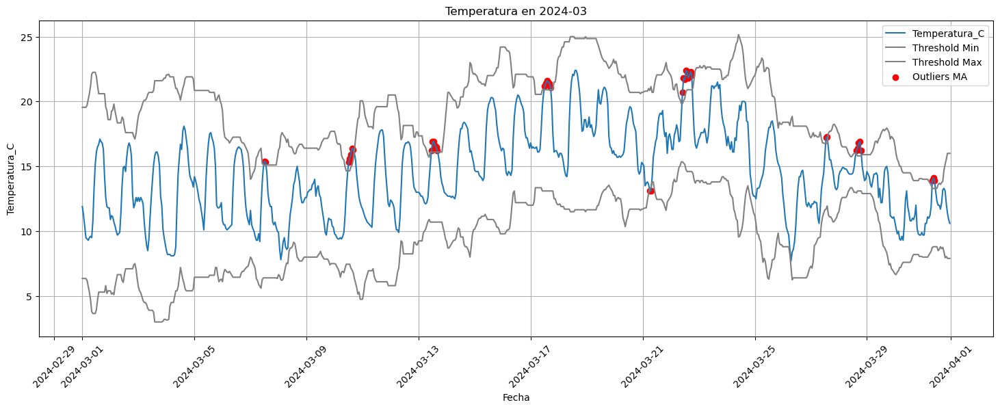

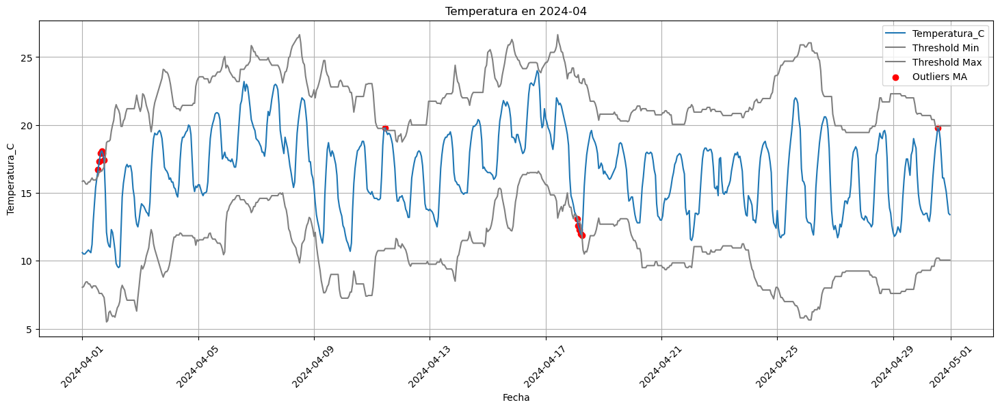

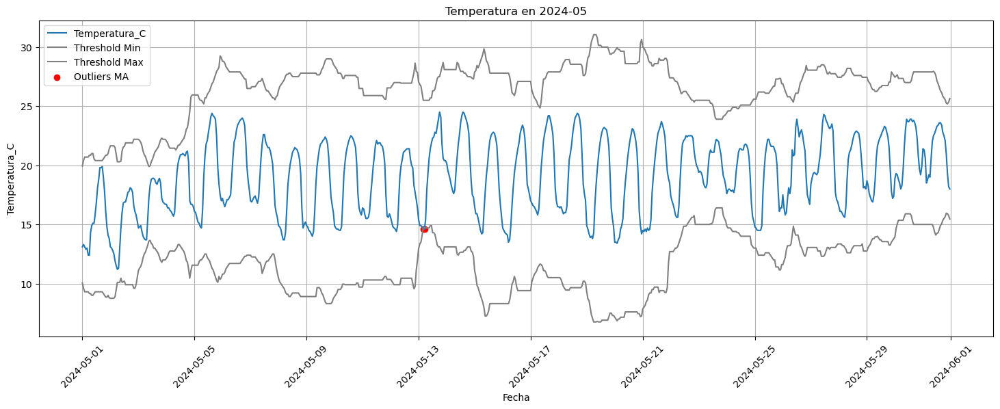

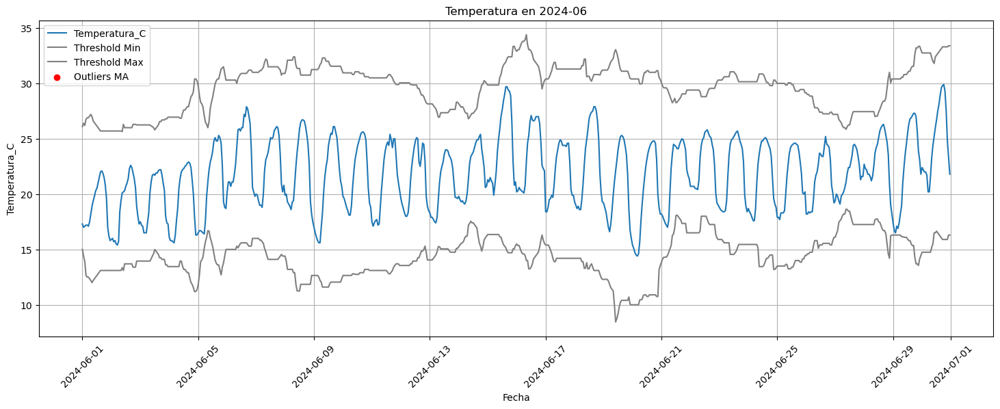

...

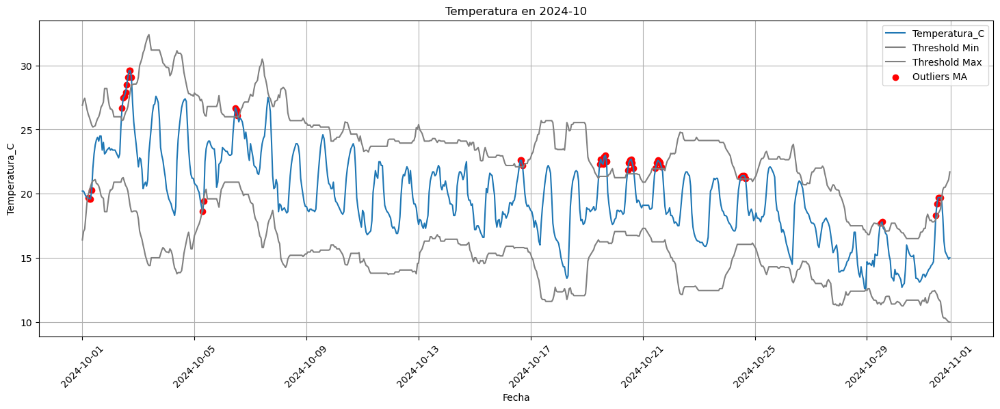

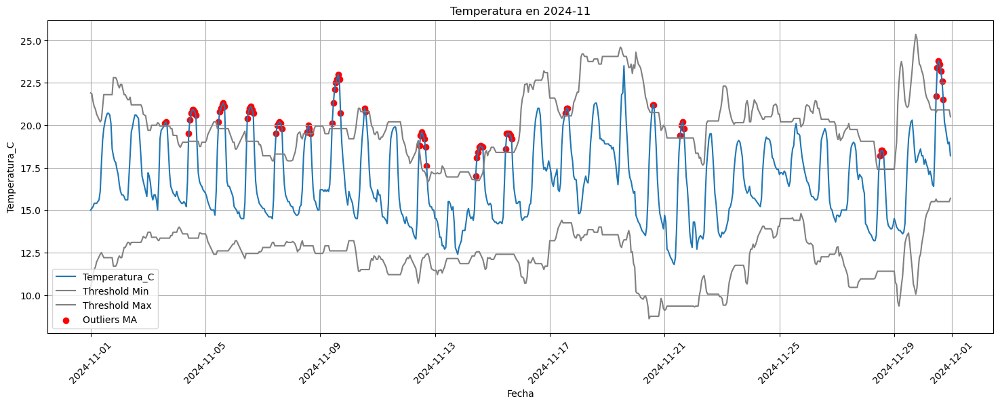

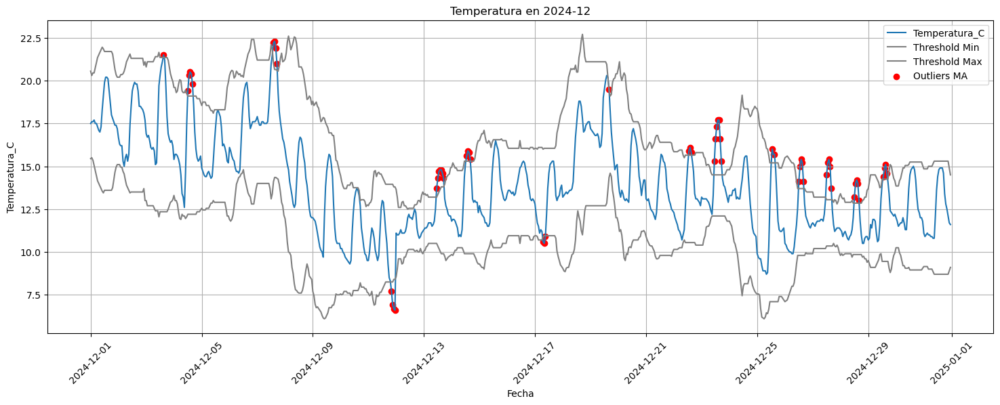

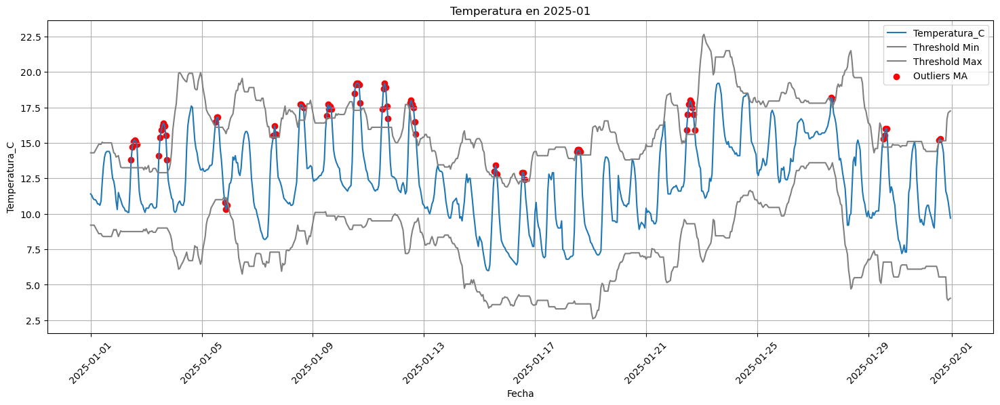

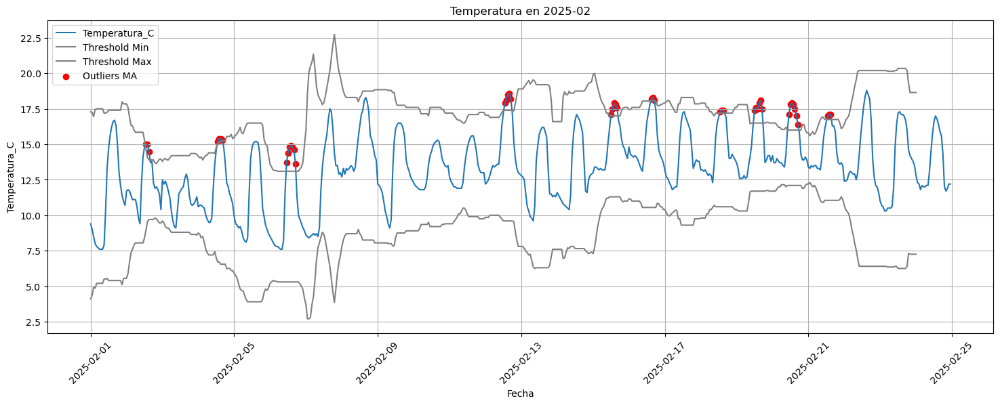

In [17]:
# Convertir la columna 'Fecha' a datetime si no lo está
df_pandas['Fecha'] = pd.to_datetime(df_pandas['Fecha'])

# Extraer año y mes para agrupar los datos
df_pandas['AñoMes'] = df_pandas['Fecha'].dt.to_period('M')

# Iterar sobre cada año-mes único y graficar
for period, df_group in df_pandas.groupby('AñoMes'):
    plt.figure(figsize=(18, 6))
    
    plt.plot(df_group['Fecha'], df_group['Temperatura_C'], label='Temperatura_C')
    plt.plot(df_group['Fecha'], threshold_min[df_group.index], color='gray', label='Threshold Min')
    plt.plot(df_group['Fecha'], threshold_max[df_group.index], color='gray', label='Threshold Max')
    plt.scatter(df_group["Fecha"][df_group["outlier_hm"]], df_group["Temperatura_C"][df_group["outlier_hm"]], color='red', label="Outliers MA")
    
    plt.xlabel('Fecha')
    plt.ylabel('Temperatura_C')
    plt.title(f'Temperatura en {period}')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.show()


Tratamiento de los datos outliers por el valor mas cercano (limite superior o limite inferior segun sea necesario)

In [18]:
df_pandas[df_pandas["outlier_hm"]==True].head()

,Fecha,Temperatura_C,Sensacion_termica_C,Humedad,Presion_mb,is_day,Hora,MA,outlier_hm,AñoMes
59,2024-02-20 11:00:00,17.4,17.4,54,1030.0,1,11,14.712500,True,2024-02
60,2024-02-20 12:00:00,18.0,18.0,52,1029.0,1,12,14.741667,True,2024-02
61,2024-02-20 13:00:00,18.2,18.2,53,1029.0,1,13,14.775000,True,2024-02
62,2024-02-20 14:00:00,18.2,18.2,54,1028.0,1,14,14.816667,True,2024-02
63,2024-02-20 15:00:00,18.0,18.0,57,1027.0,1,15,14.858333,True,2024-02


In [19]:
# Sustituir los outliers por el valor más cercano dentro del rango
df_pandas["t_corrected"] = df_pandas["Temperatura_C"].copy()
df_pandas.loc[df_pandas["Temperatura_C"] < threshold_min, "t_corrected"] = threshold_min
df_pandas.loc[df_pandas["Temperatura_C"] > threshold_max, "t_corrected"] = threshold_max

In [20]:
df_pandas[df_pandas["outlier_hm"]==True].head()

,Fecha,Temperatura_C,Sensacion_termica_C,Humedad,Presion_mb,is_day,Hora,MA,outlier_hm,AñoMes,t_corrected
59,2024-02-20 11:00:00,17.4,17.4,54,1030.0,1,11,14.712500,True,2024-02,17.2
60,2024-02-20 12:00:00,18.0,18.0,52,1029.0,1,12,14.741667,True,2024-02,17.2
61,2024-02-20 13:00:00,18.2,18.2,53,1029.0,1,13,14.775000,True,2024-02,17.2
62,2024-02-20 14:00:00,18.2,18.2,54,1028.0,1,14,14.816667,True,2024-02,17.2
63,2024-02-20 15:00:00,18.0,18.0,57,1027.0,1,15,14.858333,True,2024-02,17.2


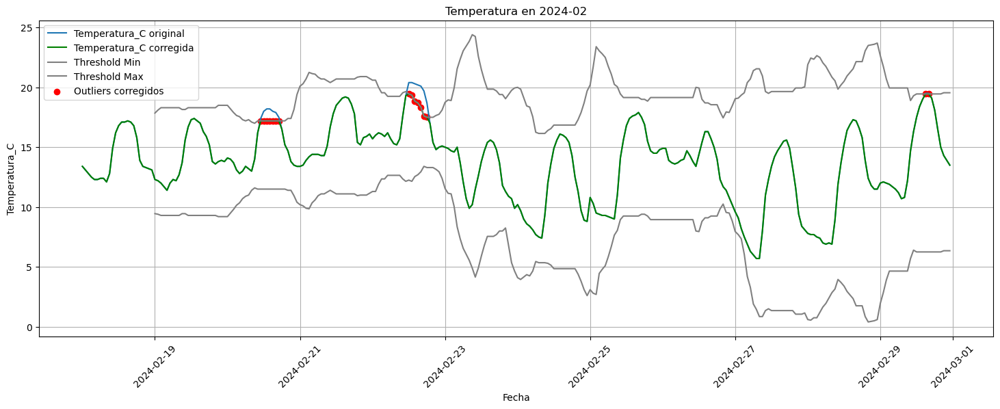

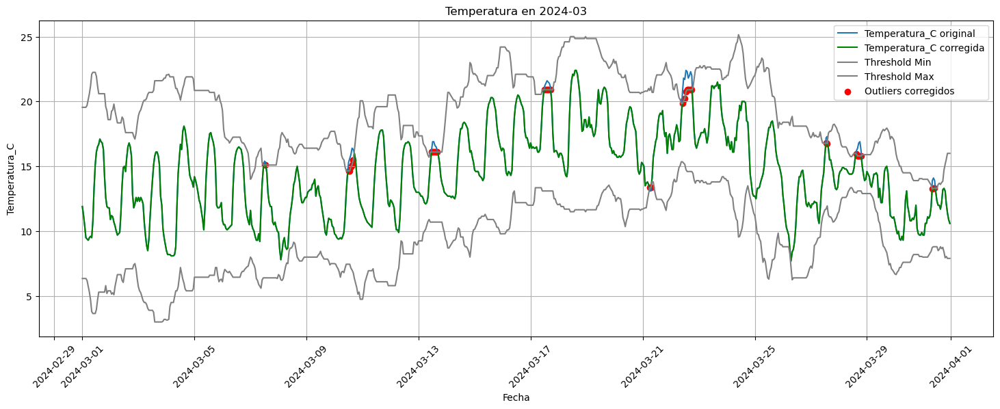

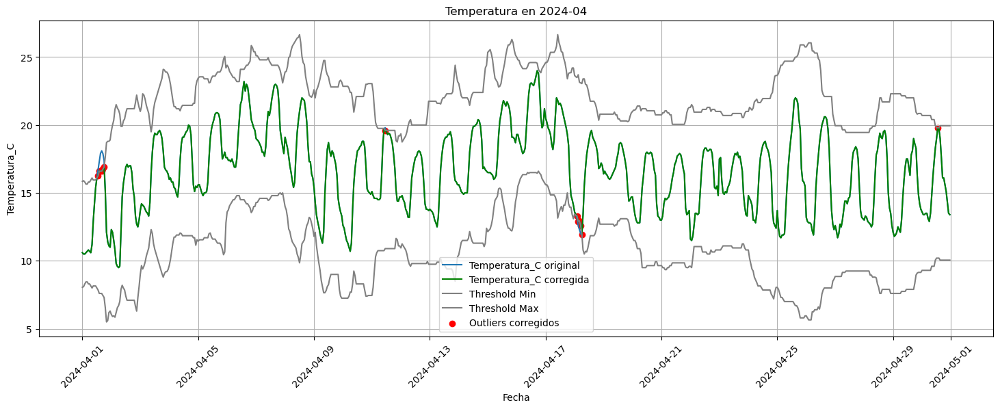

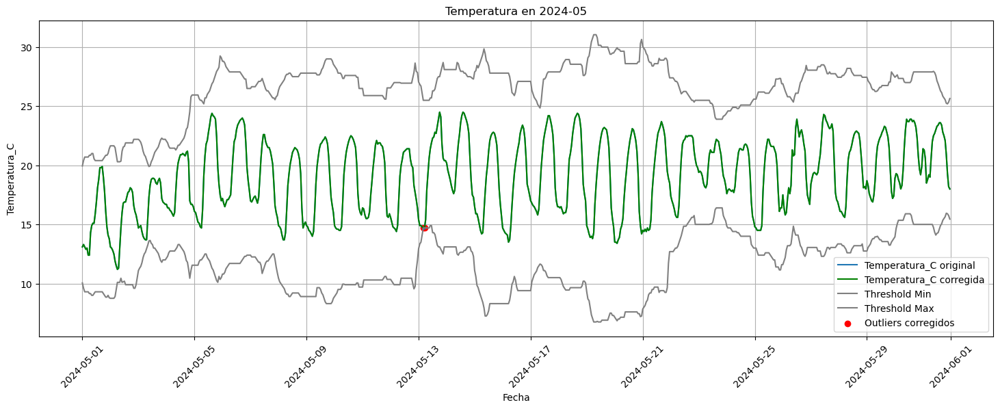

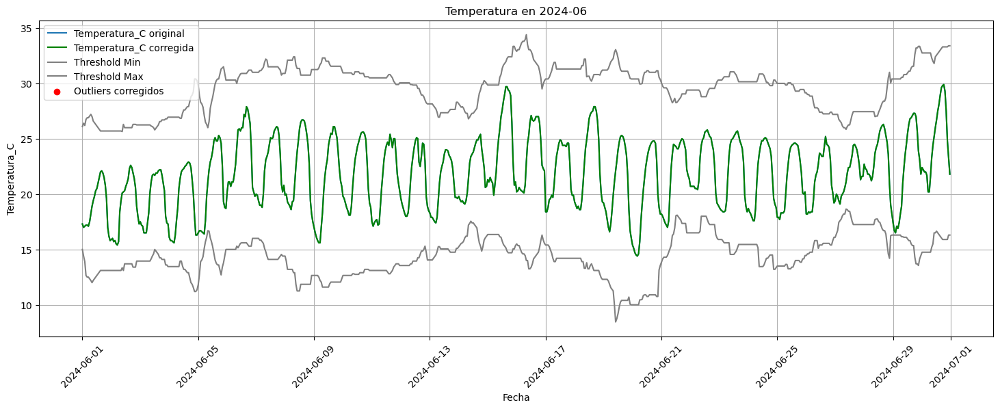

...

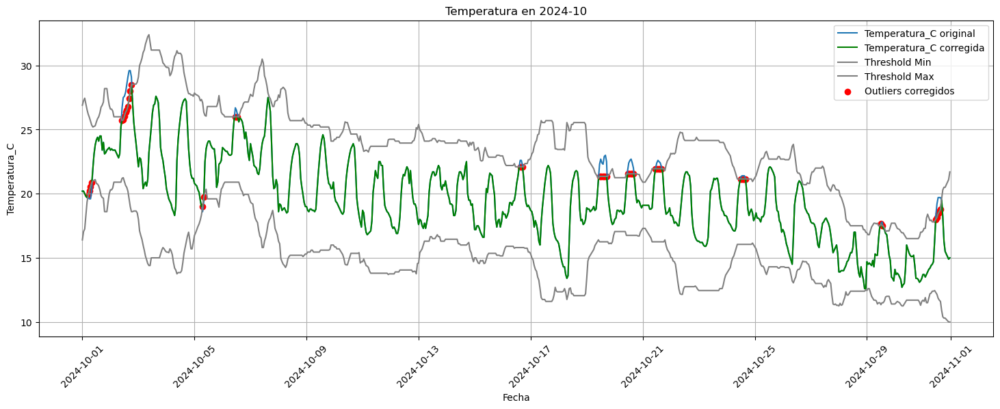

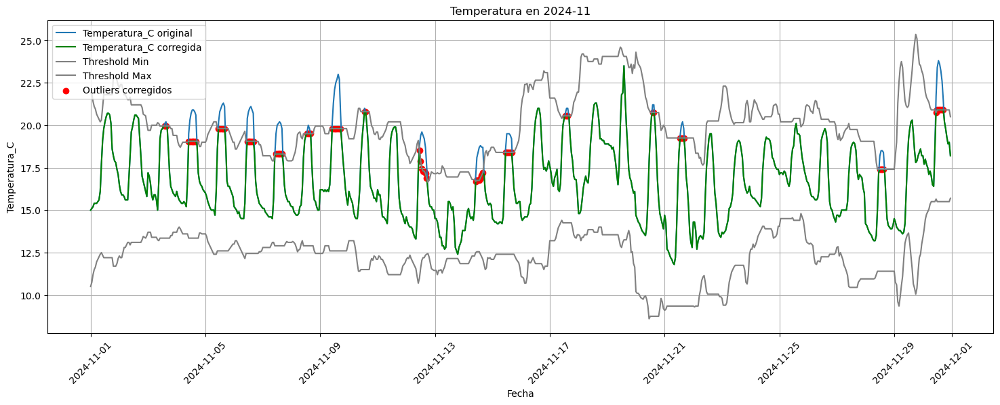

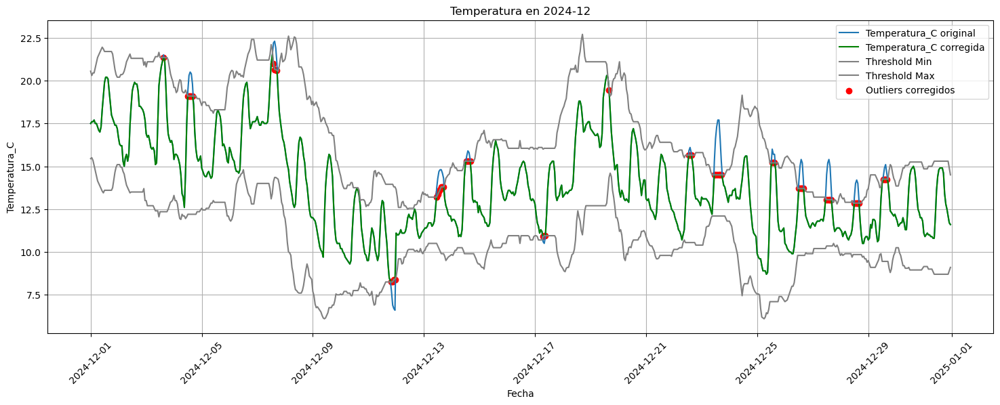

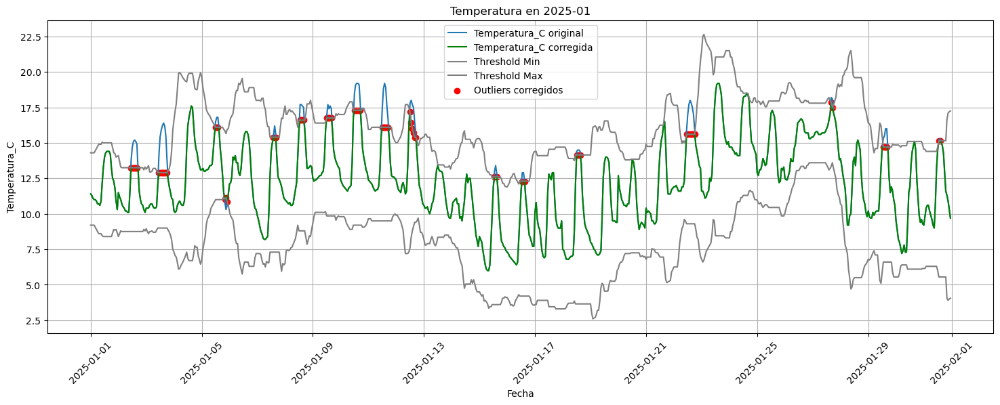

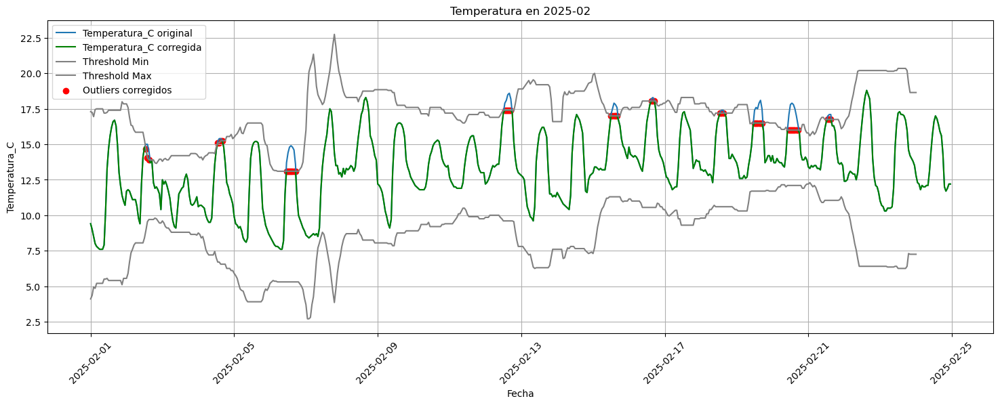

In [21]:
# Iterar sobre cada año-mes único y graficar
for period, df_group in df_pandas.groupby('AñoMes'):
    plt.figure(figsize=(18, 6))
    
    plt.plot(df_group['Fecha'], df_group['Temperatura_C'], label='Temperatura_C original')
    plt.plot(df_group['Fecha'], df_group['t_corrected'], label='Temperatura_C corregida', color='green')
    plt.plot(df_group['Fecha'], threshold_min[df_group.index], color='gray', label='Threshold Min')
    plt.plot(df_group['Fecha'], threshold_max[df_group.index], color='gray', label='Threshold Max')
    plt.scatter(df_group["Fecha"][df_group["outlier_hm"]], df_group["t_corrected"][df_group["outlier_hm"]], color='red', label="Outliers corregidos")
    
    plt.xlabel('Fecha')
    plt.ylabel('Temperatura_C')
    plt.title(f'Temperatura en {period}')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.show()


In [22]:
df_pandas

,Fecha,Temperatura_C,Sensacion_termica_C,Humedad,Presion_mb,is_day,Hora,MA,outlier_hm,AñoMes,t_corrected
0,2024-02-18 00:00:00,13.4,12.4,84,1033.0,0,0,NaN,False,2024-02,13.4
1,2024-02-18 01:00:00,13.1,12.2,84,1033.0,0,1,NaN,False,2024-02,13.1
2,2024-02-18 02:00:00,12.8,12.0,85,1033.0,0,2,NaN,False,2024-02,12.8
3,2024-02-18 03:00:00,12.5,11.6,85,1033.0,0,3,NaN,False,2024-02,12.5
4,2024-02-18 04:00:00,12.3,11.5,84,1032.0,0,4,NaN,False,2024-02,12.3
...,...,...,...,...,...,...,...,...,...,...,...
8947,2025-02-24 19:00:00,12.0,12.3,69,1028.0,1,19,13.866667,False,2025-02,12.0
8948,2025-02-24 20:00:00,11.7,11.3,70,1028.0,0,20,13.762500,False,2025-02,11.7
8949,2025-02-24 21:00:00,11.9,11.1,70,1029.0,0,21,13.675000,False,2025-02,11.9
8950,2025-02-24 22:00:00,12.2,11.4,70,1029.0,0,22,13.608333,False,2025-02,12.2


In [23]:
df_pandas["Temperatura_C"] = df_pandas["t_corrected"]

In [24]:
df_pandas.drop(columns=["MA", "outlier_hm", "t_corrected", "Sensacion_termica_C", "Presion_mb"], inplace=True)

In [25]:
df_pandas

,Fecha,Temperatura_C,Humedad,is_day,Hora,AñoMes
0,2024-02-18 00:00:00,13.4,84,0,0,2024-02
1,2024-02-18 01:00:00,13.1,84,0,1,2024-02
2,2024-02-18 02:00:00,12.8,85,0,2,2024-02
3,2024-02-18 03:00:00,12.5,85,0,3,2024-02
4,2024-02-18 04:00:00,12.3,84,0,4,2024-02
...,...,...,...,...,...,...
8947,2025-02-24 19:00:00,12.0,69,1,19,2025-02
8948,2025-02-24 20:00:00,11.7,70,0,20,2025-02
8949,2025-02-24 21:00:00,11.9,70,0,21,2025-02
8950,2025-02-24 22:00:00,12.2,70,0,22,2025-02


Ahora deberemos realizar el mismo estudio para la otra variable

Humedad

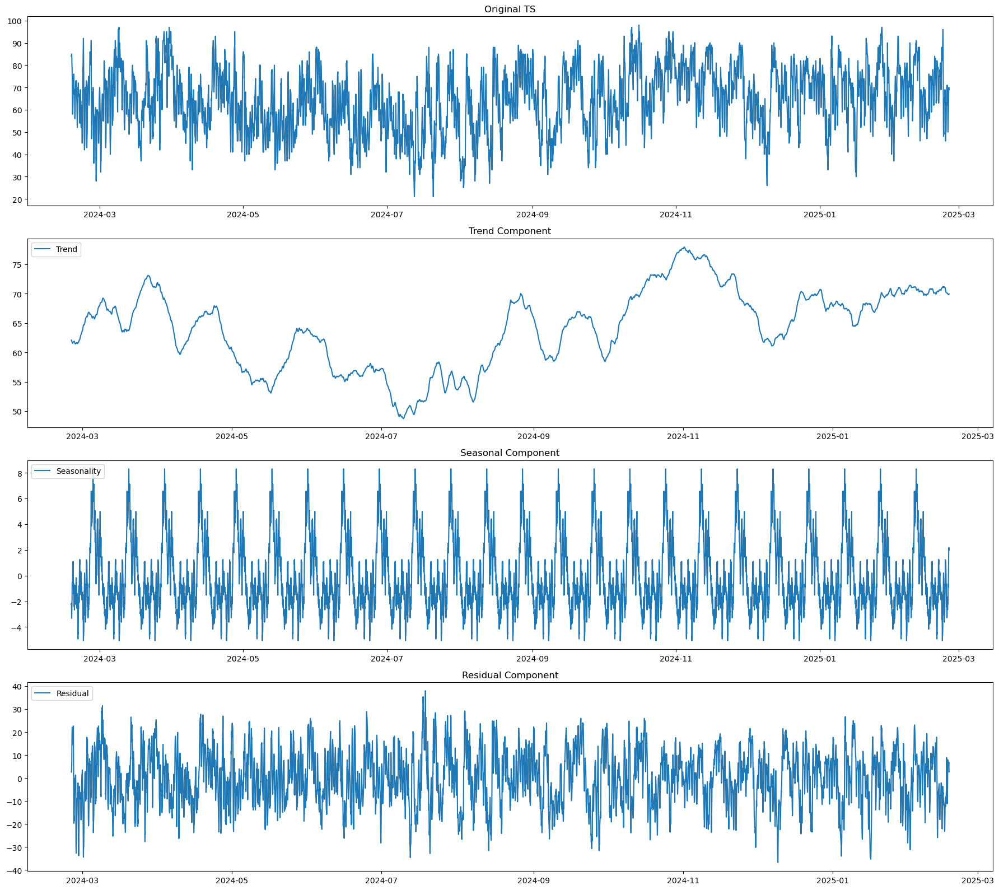

In [26]:
# Decompose the Air Passengers dataset to show trend, seasonality, and residuals
decomposition_air = seasonal_decompose(df_pandas['Humedad'], model='additive', period=365)

# Plot the decomposed components for Air Passengers
plt.figure(figsize=(18, 16))

plt.subplot(4, 1, 1)
plt.plot(df_pandas["Fecha"], df_pandas["Humedad"])
plt.title('Original TS')

plt.subplot(4, 1, 2)
plt.plot(df_pandas["Fecha"], decomposition_air.trend, label='Trend')
plt.legend(loc='upper left')
plt.title('Trend Component')

plt.subplot(4, 1, 3)
plt.plot(df_pandas["Fecha"], decomposition_air.seasonal, label='Seasonality')
plt.legend(loc='upper left')
plt.title('Seasonal Component')

plt.subplot(4, 1, 4)
plt.plot(df_pandas["Fecha"], decomposition_air.resid, label='Residual')
plt.legend(loc='upper left')
plt.title('Residual Component')

plt.tight_layout()
plt.show()

In [27]:
check_stationarity(df['Humedad'], 'Humedad')

ADF Statistic for Humedad: -9.456360255534289
p-value: 4.474098619286026e-16
The series is likely stationary.


In [28]:
window_size=48
n_sigma=3

#Calculate the median in a rolling centered window
rolling_median = df_pandas["Humedad"].rolling(window_size, center=True).median()

#Calculate the median of the absolute deviations from the data’s median in a rolling centered window
mad = df_pandas["Humedad"].rolling(window_size, center=True).apply(median_abs_deviation)

#Treshold 
threshold_min = rolling_median - n_sigma*mad
threshold_max = rolling_median + n_sigma*mad

df_pandas["outlier_hm"] = (np.abs(df_pandas["Humedad"] - rolling_median) > n_sigma*mad)

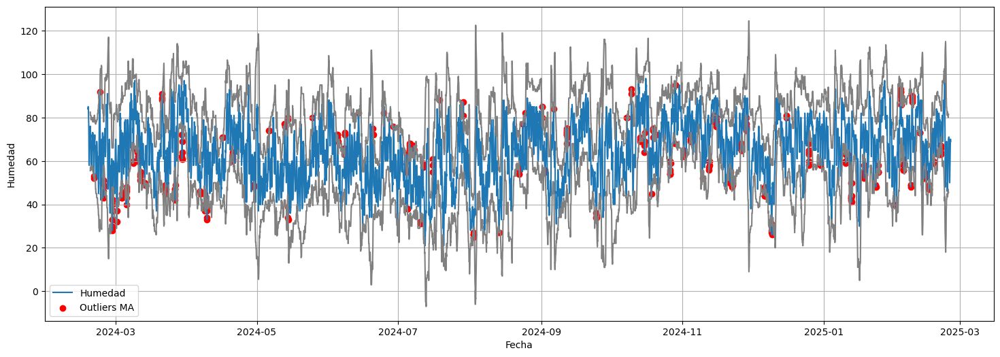

In [29]:
plt.figure(figsize=(18, 6))

plt.plot(df_pandas['Fecha'], df_pandas['Humedad'], label='Humedad')
plt.plot(df_pandas['Fecha'], threshold_min, color='gray')
plt.plot(df_pandas['Fecha'], threshold_max, color='gray')
plt.scatter(df_pandas["Fecha"][df_pandas["outlier_hm"]], df_pandas["Humedad"][df_pandas["outlier_hm"]], color='red', label="Outliers MA")
plt.xlabel('Fecha')
plt.ylabel('Humedad')
plt.legend()
plt.grid(True)
plt.show()

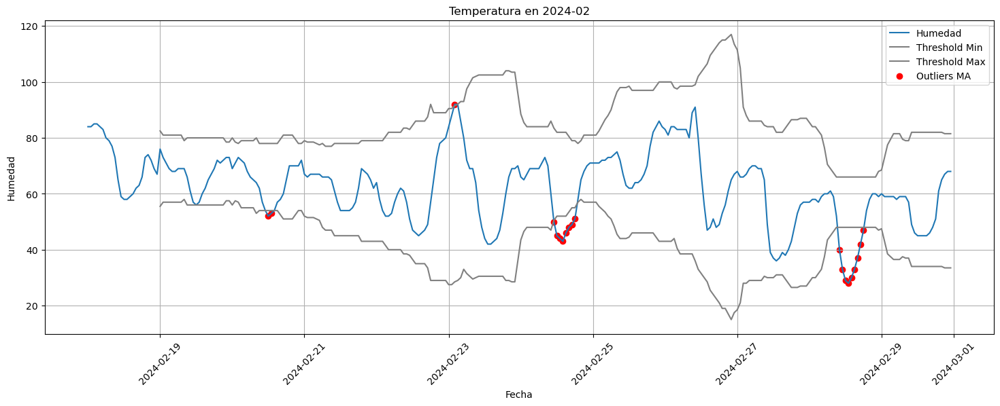

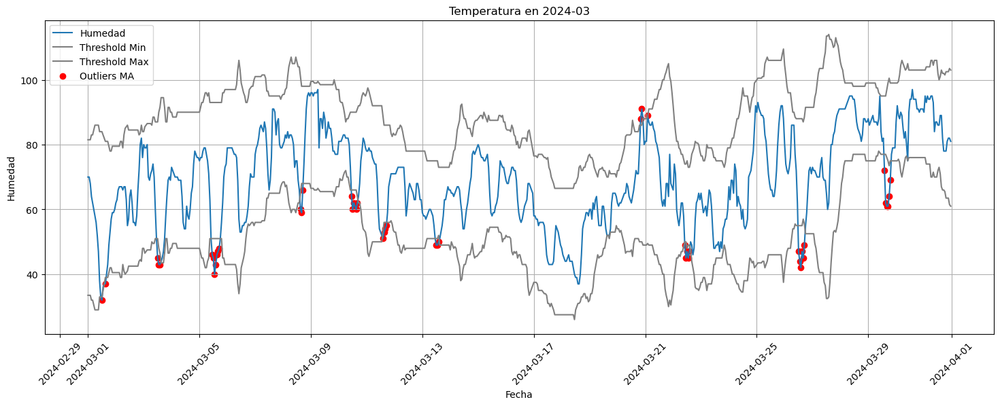

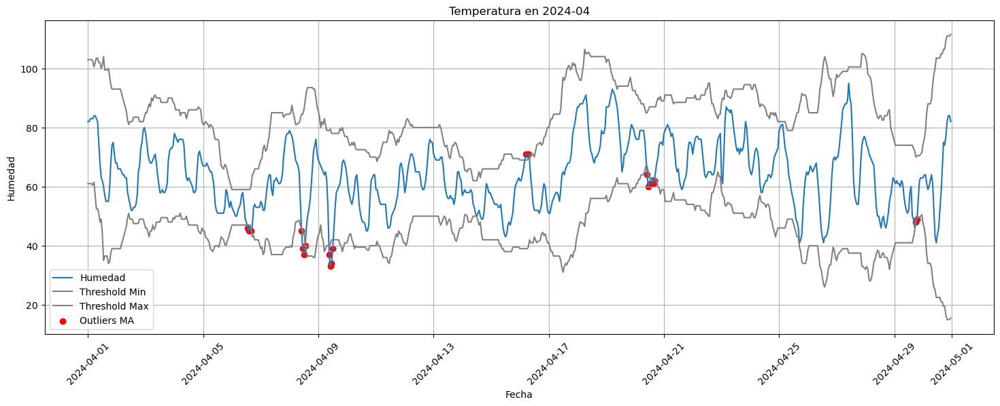

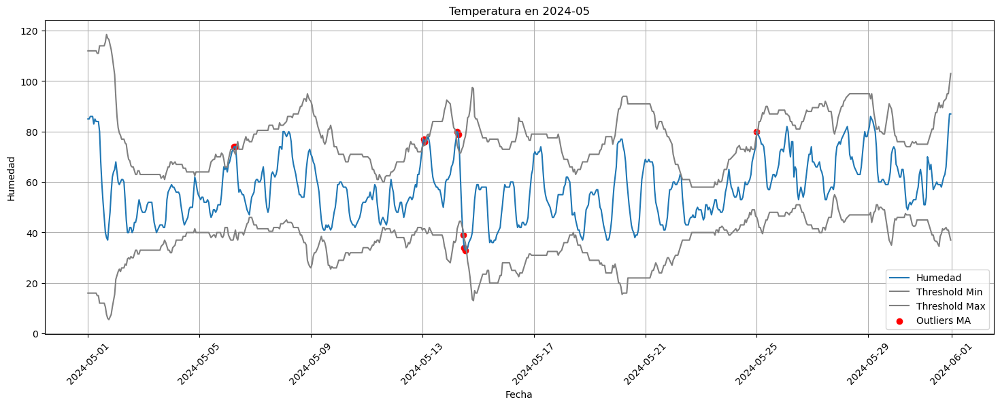

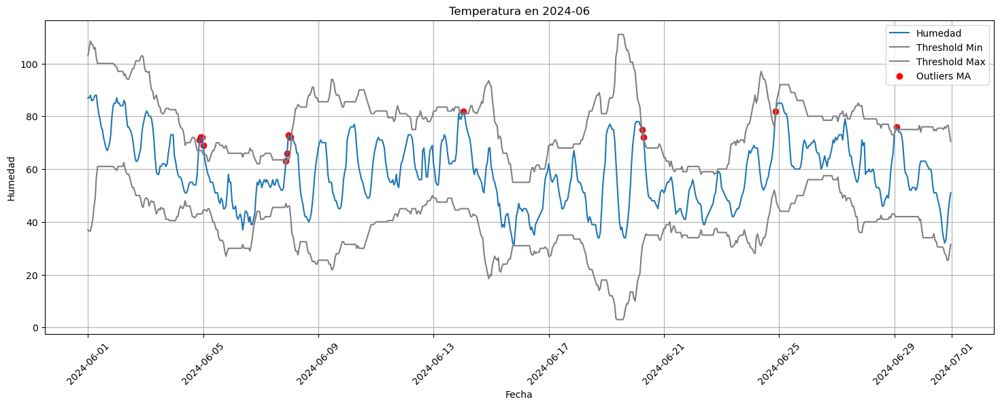

...

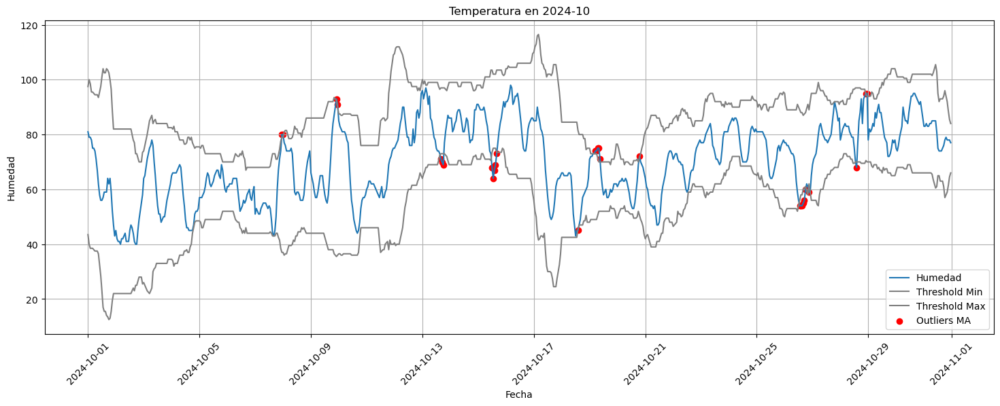

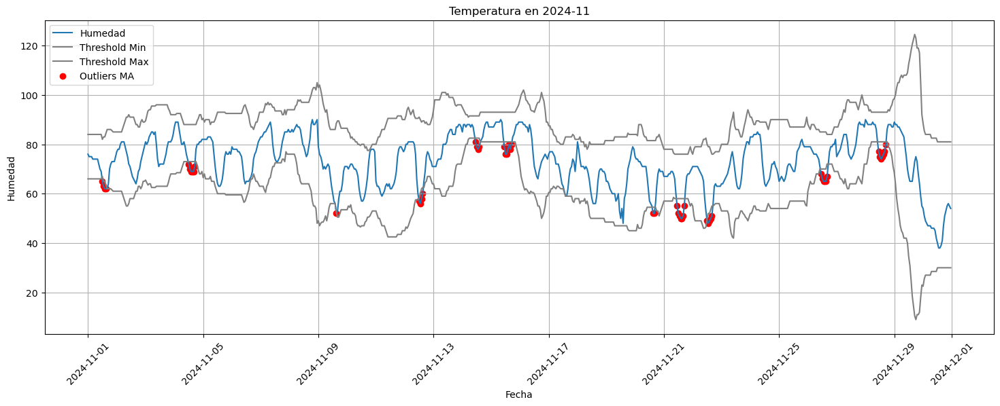

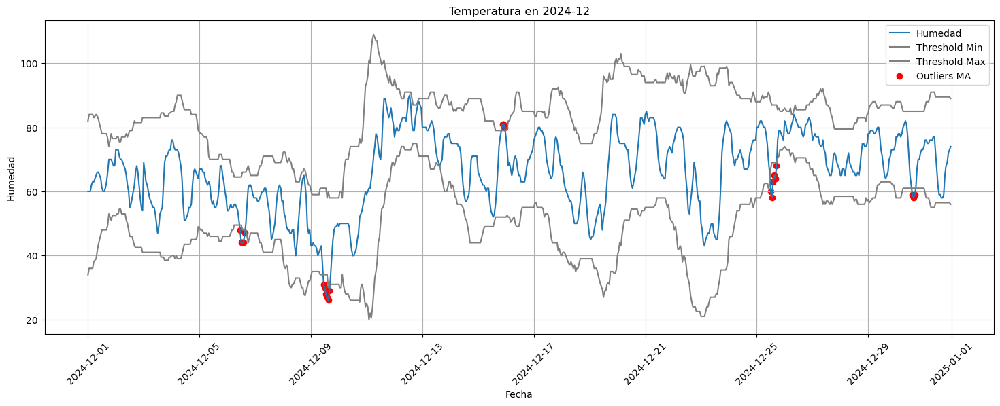

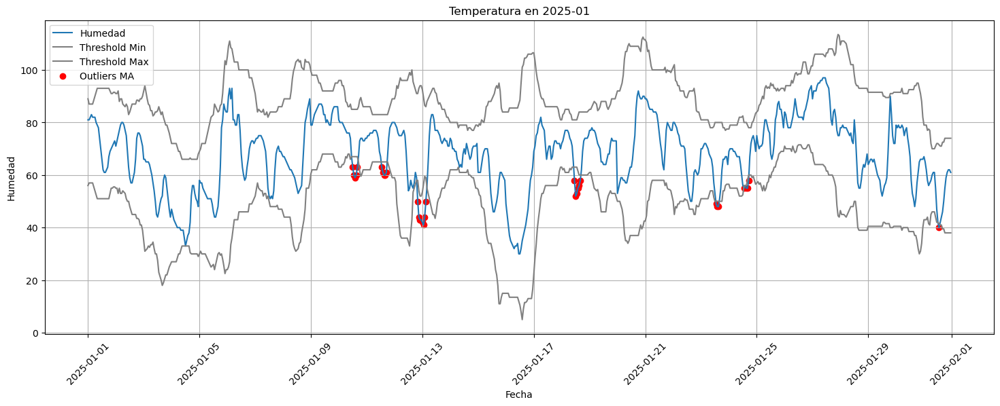

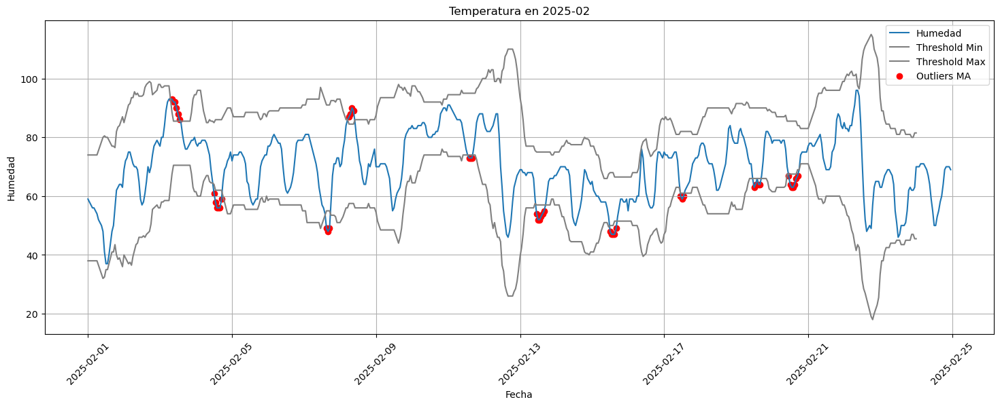

In [30]:
# Convertir la columna 'Fecha' a datetime si no lo está
df_pandas['Fecha'] = pd.to_datetime(df_pandas['Fecha'])

# Extraer año y mes para agrupar los datos
df_pandas['AñoMes'] = df_pandas['Fecha'].dt.to_period('M')

# Iterar sobre cada año-mes único y graficar
for period, df_group in df_pandas.groupby('AñoMes'):
    plt.figure(figsize=(18, 6))
    
    plt.plot(df_group['Fecha'], df_group['Humedad'], label='Humedad')
    plt.plot(df_group['Fecha'], threshold_min[df_group.index], color='gray', label='Threshold Min')
    plt.plot(df_group['Fecha'], threshold_max[df_group.index], color='gray', label='Threshold Max')
    plt.scatter(df_group["Fecha"][df_group["outlier_hm"]], df_group["Humedad"][df_group["outlier_hm"]], color='red', label="Outliers MA")
    
    plt.xlabel('Fecha')
    plt.ylabel('Humedad')
    plt.title(f'Temperatura en {period}')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.show()

In [31]:
df_pandas[df_pandas["outlier_hm"]==True].head()

,Fecha,Temperatura_C,Humedad,is_day,Hora,AñoMes,outlier_hm
60,2024-02-20 12:00:00,17.2,52,1,12,2024-02,True
61,2024-02-20 13:00:00,17.2,53,1,13,2024-02,True
122,2024-02-23 02:00:00,14.7,92,0,2,2024-02,True
155,2024-02-24 11:00:00,13.6,50,1,11,2024-02,True
156,2024-02-24 12:00:00,14.9,45,1,12,2024-02,True


In [35]:
df_pandas["Humedad"] = df_pandas["Humedad"].astype(float)

In [36]:
# Sustituir los outliers por el valor más cercano dentro del rango
df_pandas["h_corrected"] = df_pandas["Humedad"].copy()
df_pandas.loc[df_pandas["Humedad"] < threshold_min, "h_corrected"] = threshold_min
df_pandas.loc[df_pandas["Humedad"] > threshold_max, "h_corrected"] = threshold_max

In [37]:
df_pandas[df_pandas["outlier_hm"]==True].head()

,Fecha,Temperatura_C,Humedad,is_day,Hora,AñoMes,outlier_hm,h_corrected
60,2024-02-20 12:00:00,17.2,52.0,1,12,2024-02,True,54.0
61,2024-02-20 13:00:00,17.2,53.0,1,13,2024-02,True,54.0
122,2024-02-23 02:00:00,14.7,92.0,0,2,2024-02,True,91.5
155,2024-02-24 11:00:00,13.6,50.0,1,11,2024-02,True,50.5
156,2024-02-24 12:00:00,14.9,45.0,1,12,2024-02,True,52.0


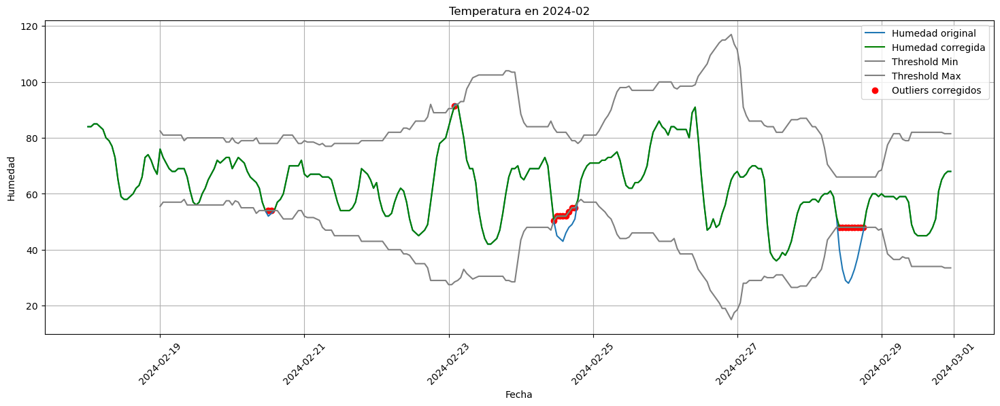

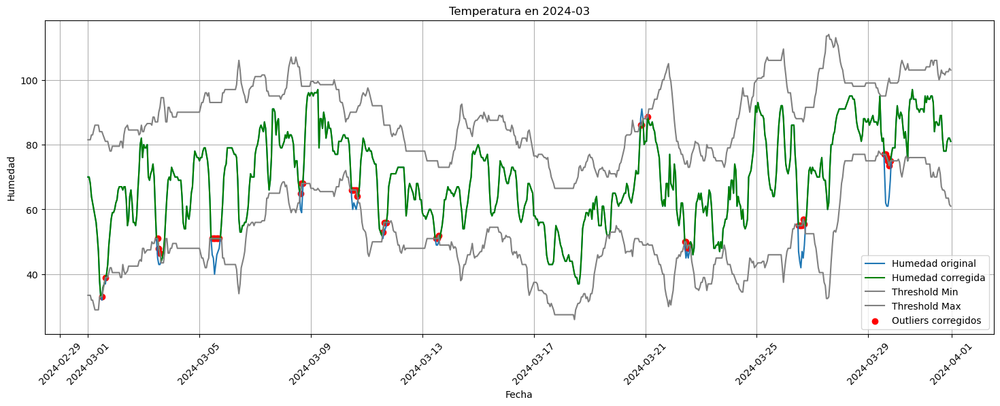

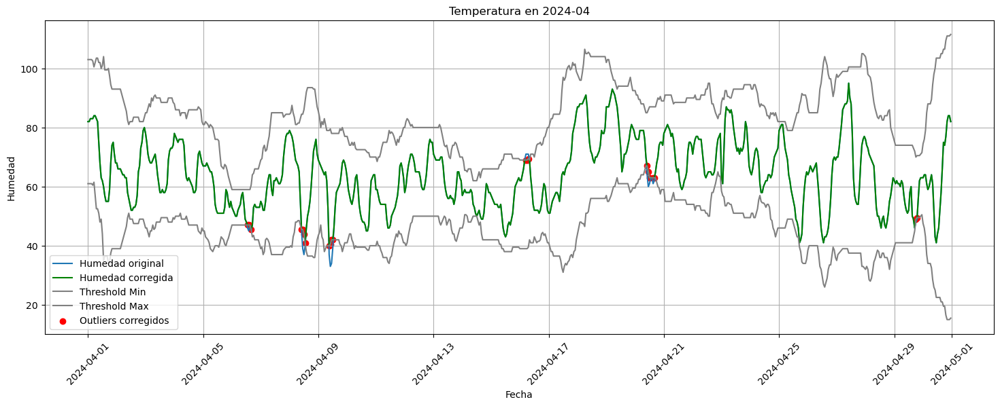

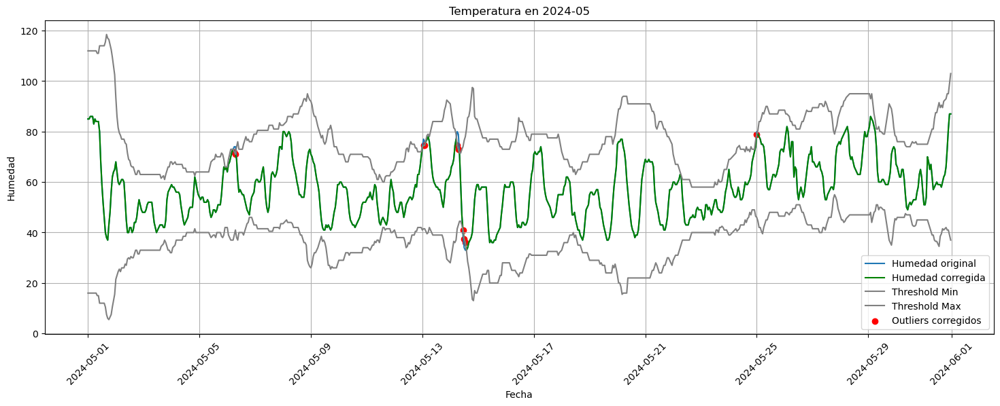

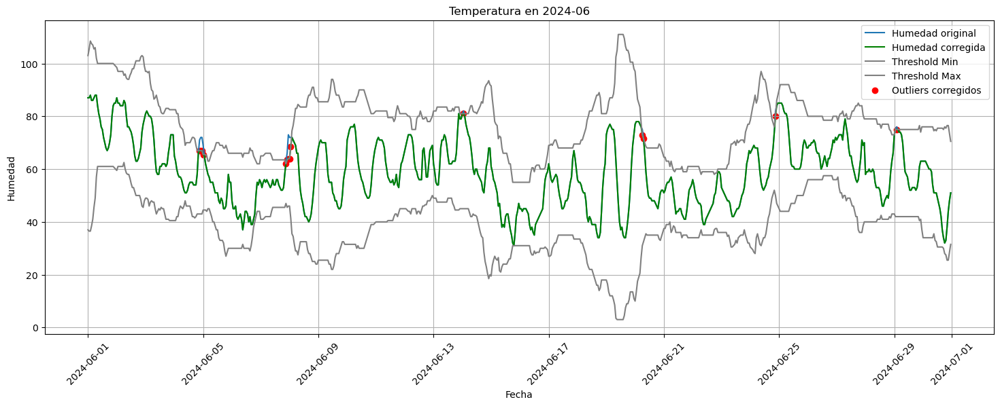

...

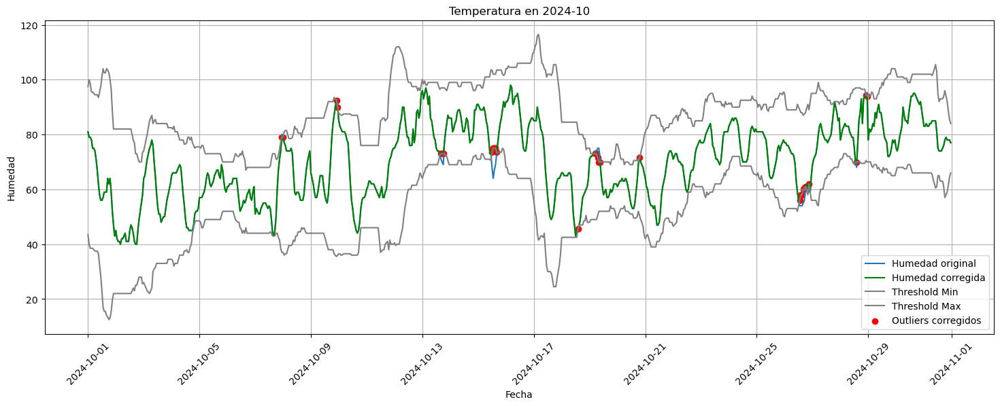

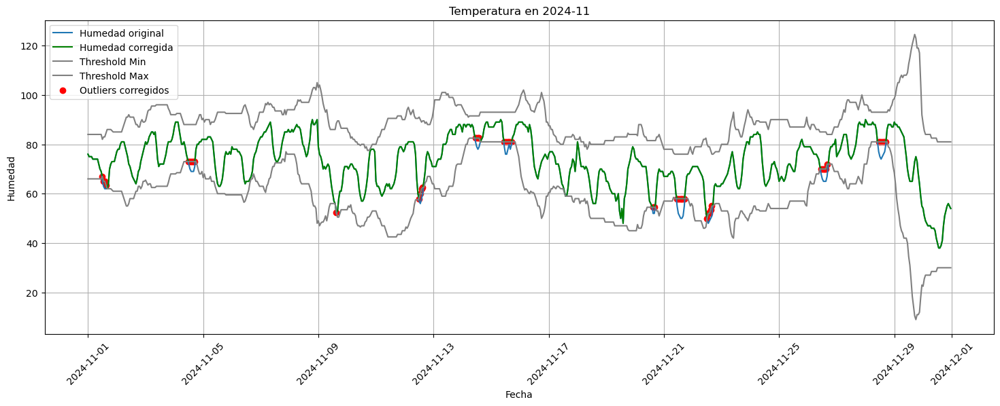

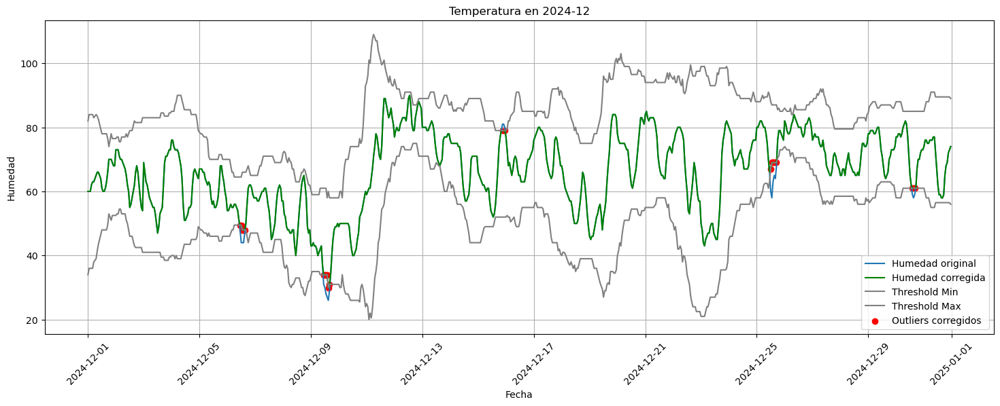

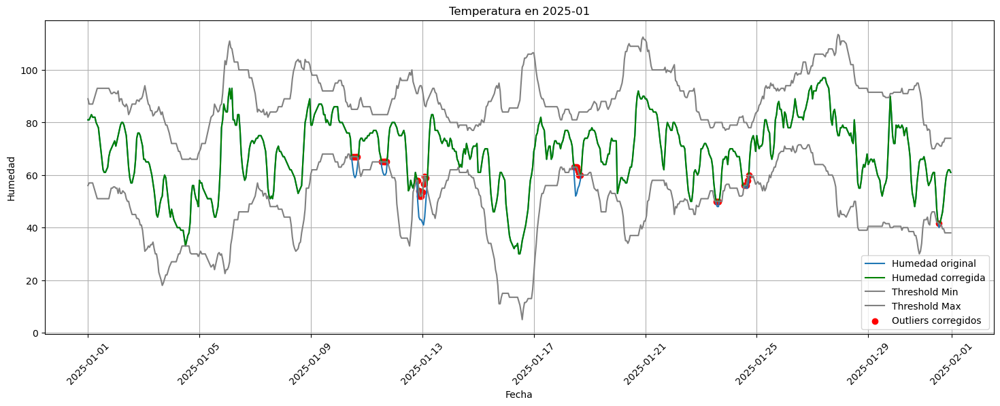

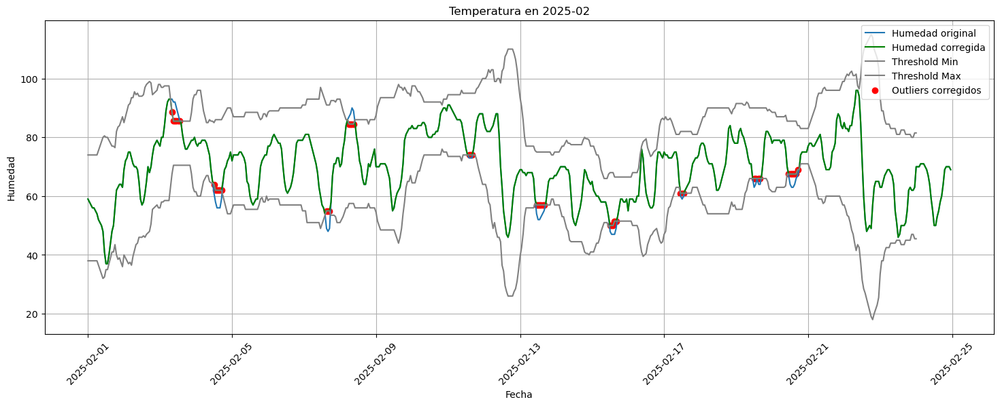

In [38]:
# Iterar sobre cada año-mes único y graficar
for period, df_group in df_pandas.groupby('AñoMes'):
    plt.figure(figsize=(18, 6))
    
    plt.plot(df_group['Fecha'], df_group['Humedad'], label='Humedad original')
    plt.plot(df_group['Fecha'], df_group['h_corrected'], label='Humedad corregida', color='green')
    plt.plot(df_group['Fecha'], threshold_min[df_group.index], color='gray', label='Threshold Min')
    plt.plot(df_group['Fecha'], threshold_max[df_group.index], color='gray', label='Threshold Max')
    plt.scatter(df_group["Fecha"][df_group["outlier_hm"]], df_group["h_corrected"][df_group["outlier_hm"]], color='red', label="Outliers corregidos")
    
    plt.xlabel('Fecha')
    plt.ylabel('Humedad')
    plt.title(f'Temperatura en {period}')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.show()

In [39]:
df_pandas

,Fecha,Temperatura_C,Humedad,is_day,Hora,AñoMes,outlier_hm,h_corrected
0,2024-02-18 00:00:00,13.4,84.0,0,0,2024-02,False,84.0
1,2024-02-18 01:00:00,13.1,84.0,0,1,2024-02,False,84.0
2,2024-02-18 02:00:00,12.8,85.0,0,2,2024-02,False,85.0
3,2024-02-18 03:00:00,12.5,85.0,0,3,2024-02,False,85.0
4,2024-02-18 04:00:00,12.3,84.0,0,4,2024-02,False,84.0
...,...,...,...,...,...,...,...,...
8947,2025-02-24 19:00:00,12.0,69.0,1,19,2025-02,False,69.0
8948,2025-02-24 20:00:00,11.7,70.0,0,20,2025-02,False,70.0
8949,2025-02-24 21:00:00,11.9,70.0,0,21,2025-02,False,70.0
8950,2025-02-24 22:00:00,12.2,70.0,0,22,2025-02,False,70.0


In [40]:
df_pandas["Humedad"] = df_pandas["h_corrected"]
df_pandas.drop(columns=["outlier_hm", "h_corrected"], inplace=True)
df_pandas

,Fecha,Temperatura_C,Humedad,is_day,Hora,AñoMes
0,2024-02-18 00:00:00,13.4,84.0,0,0,2024-02
1,2024-02-18 01:00:00,13.1,84.0,0,1,2024-02
2,2024-02-18 02:00:00,12.8,85.0,0,2,2024-02
3,2024-02-18 03:00:00,12.5,85.0,0,3,2024-02
4,2024-02-18 04:00:00,12.3,84.0,0,4,2024-02
...,...,...,...,...,...,...
8947,2025-02-24 19:00:00,12.0,69.0,1,19,2025-02
8948,2025-02-24 20:00:00,11.7,70.0,0,20,2025-02
8949,2025-02-24 21:00:00,11.9,70.0,0,21,2025-02
8950,2025-02-24 22:00:00,12.2,70.0,0,22,2025-02


Ahora pasaremos a obtener nuevas columnas que aporten informacion al modelo para mejorar las predicciones

In [41]:
df = df_pandas.copy()

In [42]:
# Convertir la columna 'fecha' a tipo datetime
df['Fecha'] = pd.to_datetime(df['Fecha'])

# Ordenar por fecha
df = df.sort_values('Fecha')

# Verificar que no haya duplicados
df = df.drop_duplicates(subset=['Fecha'])

##### Obtenemos la estacion del año para cada fecha

In [43]:
# Crear columna de estación del año
def get_season(month):
    if month in [12, 1, 2]:
        return 'Invierno'
    elif month in [3, 4, 5]:
        return 'Primavera'
    elif month in [6, 7, 8]:
        return 'Verano'
    elif month in [9, 10, 11]:
        return 'Otoño'

In [44]:
df['estacion'] = df['Fecha'].dt.month.apply(get_season)

Aplicamos transformacion OHE (One Hot Encoding) para la utilizacion de esta informacion de cara al modelo

In [45]:
# Aplicar get_dummies
df = pd.get_dummies(df, columns=['estacion'])

In [46]:
df.head(5)

,Fecha,Temperatura_C,Humedad,is_day,Hora,AñoMes,estacion_Invierno,estacion_Otoño,estacion_Primavera,estacion_Verano
0,2024-02-18 00:00:00,13.4,84.0,0,0,2024-02,True,False,False,False
1,2024-02-18 01:00:00,13.1,84.0,0,1,2024-02,True,False,False,False
2,2024-02-18 02:00:00,12.8,85.0,0,2,2024-02,True,False,False,False
3,2024-02-18 03:00:00,12.5,85.0,0,3,2024-02,True,False,False,False
4,2024-02-18 04:00:00,12.3,84.0,0,4,2024-02,True,False,False,False


In [47]:
df.columns

Index(['Fecha', 'Temperatura_C', 'Humedad', 'is_day', 'Hora', 'AñoMes',
       'estacion_Invierno', 'estacion_Otoño', 'estacion_Primavera',
       'estacion_Verano'],
      dtype='object')

Guardamos el dataframe final preparado para pasar al entrenamiento del modelo

In [ ]:
# Guardar el DataFrame limpio en un nuevo archivo CSV (opcional)
ruta_guardado = "/home/jovyan/work/data/homogeneized/Marbella/df_marbella_hourly.csv"
df.to_csv(ruta_guardado, index=False)

In [49]:
# Detener la sesión de Spark
spark.stop()